In [1]:
import numpy as np
import csv
import matplotlib.pyplot as plt
import astropy.constants as cte
import astropy.units as un
from astropy.cosmology import Planck15 as cosmo
import emcee
import scipy
from scipy import optimize as op
import corner
import os
os.environ["OMP_NUM_THREADS"] = "8"
from multiprocessing import Pool
import time
from datetime import datetime 

from scipy.optimize import minimize

In [2]:
c=cte.c
c_um=c.to("um/s")
c_mm=c.to("mm/s")

c = c.value # m/s

Msun=cte.M_sun
Msun = Msun.value # kg

h = cte.h.value

K=cte.k_B.value

In [3]:
file = open("/Users/mariajesusfloresmoraga/Desktop/DSFG/book2.csv")
csvreader = csv.reader(file)
header = []
header = next(csvreader)

rows = []
for row in csvreader:
        rows.append(row)

ID= []

z=[]

S3=[]
errS3=[]

S2=[]
errS2=[]

S1=[]
errS1=[]

S870=[]
errS870=[]

S500=[]
errS500=[]

S350=[]
errS350=[]

S250=[]
errS250=[]

S160=[]
errS160=[]

S100=[]
errS100=[]

for j in rows:   
    
    ID.append(j[0])
    z.append(float(j[1]))
    S3.append(float(j[2]))
    errS3.append(float(j[3]))
    S2.append(float(j[4]))
    errS2.append(float(j[5]))
    S1.append(float(j[6]))
    errS1.append(float(j[7]))
    S870.append(float(j[8]))
    errS870.append(float(j[9]))
    S500.append(float(j[10]))
    errS500.append(float(j[11]))
    S350.append(float(j[12]))
    errS350.append(float(j[13]))
    S250.append(float(j[14]))
    errS250.append(float(j[15]))
    S160.append(float(j[16]))
    errS160.append(float(j[17]))
    S100.append(float(j[18]))
    errS100.append(float(j[19]))

In [4]:
len(rows)

81

In [5]:
v__=np.array([500,350,250,160,100])*un.um
v_=(c_um/v__).to("Hz")
v=v_.value
l__=np.array([95,150,220])*un.GHz
l_=l__.to("Hz")
l=l_.value
vf=np.concatenate((l,v))
print(vf)

[9.50000000e+10 1.50000000e+11 2.20000000e+11 5.99584916e+11
 8.56549880e+11 1.19916983e+12 1.87370286e+12 2.99792458e+12]


In [6]:
vf_80=[]  #lista con 80 arrays de vf
for x in range(len(rows)):
    vf_80.append(vf)

In [7]:
frecsT_l=[]
errfT_l=[]
for m in range (len(rows)):
    
    frec=[S3[m],S2[m],S1[m],S500[m],S350[m],S250[m],S160[m],S100[m]]
    errf=[errS3[m],errS2[m],errS1[m],errS500[m],errS350[m],errS250[m],errS160[m],errS100[m]]
    frecsT_l.append(frec)
    errfT_l.append(errf)
    
datos=[]  #todas estas listas son iguales. Definí varias, para después evitar borrar datos donde no queremos
datos_2=[]
datos_3=[]
datos_4=[]

for x,y in zip(frecsT_l,errfT_l):
    datos_=[]
    datos_.append(x)
    datos_.append(y)
    datos.append(datos_) #así, la lista datos está formada por muchos pares de listas. En cada par está flux y err_flux
    datos_2.append(datos_)
    datos_3.append(datos_)
    datos_4.append(datos_)

In [8]:
for i in range(len(datos)):  #ejemplo de como queda la lista
    print("Para {}; flujos:{}, errores:{}".format(ID[i],datos[i][0],datos[i][1]))

Para SPT0002-52; flujos:[0.47, 3.1, 10.7, 202.0, 283.5, 332.9, 234.3, 93.9], errores:[0.03, 0.9, 5.8, 10.0, 8.9, 10.1, 21.3, 5.4]
Para SPT0020-51; flujos:[1.25, 6.6, 19.9, 144.1, 120.9, 71.5, nan, nan], errores:[0.05, 1.4, 4.6, 8.6, 7.4, 7.5, 8.7, 2.7]
Para SPT0027-50; flujos:[1.41, 8.6, 35.6, 316.1, 325.7, 232.9, 85.6, 15.8], errores:[0.05, 1.4, 5.1, 8.1, 7.2, 6.8, 13.0, 2.3]
Para SPT0054-41; flujos:[1.8, 10.4, 32.5, 174.2, 125.9, 79.0, nan, nan], errores:[0.06, 1.5, 5.3, 10.3, 8.9, 9.3, nan, nan]
Para SPT0103-45; flujos:[1.46, 8.2, 30.6, 231.6, 213.3, 133.2, nan, nan], errores:[0.23, 1.5, 5.2, 7.6, 6.8, 10.8, 15.7, 4.4]
Para SPT0106-64; flujos:[2.15, 12.7, 42.6, 237.3, 255.7, 151.9, 64.1, nan], errores:[0.07, 1.3, 4.9, 8.7, 10.1, 8.0, 13.5, 4.1]
Para SPT0109-47; flujos:[1.11, 6.9, 15.6, 213.9, 219.4, 166.4, 57.3, nan], errores:[0.04, 1.5, 5.0, 8.4, 9.1, 8.8, 9.5, 2.8]
Para SPT0112-55; flujos:[0.18, 4.3, 17.3, 37.0, 38.0, nan, nan, nan], errores:[0.03, 1.1, 4.7, 7.3, 6.3, 6.3, nan, na

In [9]:
nans = np.isnan(datos_2[3][1])
print(nans)

[False False False False False False  True  True]


In [10]:
masknan = ~nans
print(masknan)

[ True  True  True  True  True  True False False]


In [11]:
f3 = np.asarray(datos_2[3][0])   
e3 = np.asarray(datos_2[3][1])
vf3 = np.asarray(vf_80[3])

mf3 = f3[masknan]
me3 = e3[masknan]
mvf3 = vf3[masknan]

print(mf3)
print(me3)
print(mvf3)

[  1.8  10.4  32.5 174.2 125.9  79. ]
[ 0.06  1.5   5.3  10.3   8.9   9.3 ]
[9.50000000e+10 1.50000000e+11 2.20000000e+11 5.99584916e+11
 8.56549880e+11 1.19916983e+12]


In [12]:
#misma idea pero en un for

f_arr = []
e_arr = []
vf_arr = []

for i in range(len(rows)):
    masknan = ~np.isnan(datos_2[i][0])
    f = np.asarray(datos_2[i][0])
    e = np.asarray(datos_2[i][1])
    vf = np.asarray(vf_80[i])
    
    f_arr.append(f[masknan])
    e_arr.append(e[masknan])
    vf_arr.append(vf[masknan])

In [13]:
def tau(z,M_,d_,vf): 
    vf=vf*un.Hz
    d_=d_*un.kpc
    v0=353*un.GHz
    b=2
    M=cte.M_sun * 10** M_
    k0=0.15*(un.m**2/un.kg) 
    tau=k0*(vf/v0)**b *(z+1)**b * M/(np.pi*(d_/2)**2)
    return tau.to("")

In [14]:
x1 = np.linspace(90,2000,100)*un.GHz
x2=x1.to("Hz")
x2=x2.value

In [15]:
def P(vf,T,z):
    vf=vf*un.Hz
    T=T*un.K
    h=cte.h
    K=cte.k_B
    A=2*h/(cte.c**2)
    a=(h*vf*(1+z)/(K*T))
    B=vf**3/(np.e**(a.value) -1)
    P=(A*B).to("mJy")
    return P

In [17]:
zD = np.linspace(0.,1000,100000)
D = scipy.interpolate.interp1d(zD, cosmo.angular_diameter_distance(zD).to("m").value, kind='linear')

def modelSv(vf,z,T,M_,d_):
    
    vf=vf # Hz
    d_=d_*3.08567758128e19 #kpc to m
    v0=353.0*1e9 #GHz to Hz
    b=2.
    M=Msun * 10.** M_
    k0=0.15 # m**2 / kg
    tau=k0*(vf/v0)**b *(z+1.)**b * M/(np.pi*(d_/2)**2)

    A=2*h/(c**2)
    a=(h*vf*(1+z)/(K*T))
    B=vf**3/(np.e**(a) -1)
    P=A*B
    
    b=2
    D_ = D(z)

    TAU=tau
    PL=P

    O=np.pi*(d_/2)**2 * (D_**-2)
    
    S_=O*(1-np.e**-TAU)*PL*1e29

    return S_

In [18]:
def A(z,Tc,M_,d_,vf): 

    vf=vf #en Hz
    
    v0=353.0*1e9
    b=2
    
    Tvariable=(np.linspace(Tc,1000,10000))
    
    integrales=[]
    
    for i in vf:
        ARG = modelSv(i,z,Tvariable,M_,d_) *(Tvariable)**-7 
        integrales.append(scipy.integrate.trapz(ARG,x=Tvariable))
    
    return integrales

In [19]:
zD = np.linspace(0.,1000,100000)
D = scipy.interpolate.interp1d(zD, cosmo.angular_diameter_distance(zD).to("m").value, kind='linear')
def modelSobs(vf,z,Tc,M_,d_): #Como SPT no entrega Tc tomamos Tc= T-10]
    
    vf=vf
    b=2
    v0=353.0*1e9 #GHz to Hz
    TCMB=2.725 #en K
    
    INTEGRAL=A(z,Tc,M_,d_,vf)
    TAU=tau(z,M_,d_,vf)
    
    h=(cte.h.si).value
    K=(cte.k_B.si).value
    c=(cte.c.si).value
    
    d_=d_*3.08567758128e19 #kpc to m
    Tc=Tc # en K
    D_=D(z)
    O=np.pi*(d_/2)**2 * (D_**-2)
    model_=[]
    for j in range(len(vf)):
        M1=6 * Tc**6 * INTEGRAL[j]
    
        M2=O * np.e**-TAU * (2*h)/(c**2) * (vf[j]**3)/(np.e**(h*vf[j]/(K*TCMB))-1)
    
        model_.append(((M1+M2)[0]).value)
        
    model=model_*un.mJy

    return model.value

In [20]:
def ml_PL_lim(ID,Flux,errFlux): #PL
    
    #popt,pconv = scipy.optimize.curve_fit(modelSobs,vf,frecsT,[3.,35,10.,4.],bounds=([1,20,8,2,0.],[10,50,11,4,-10.]))
    
    #z_fit,T_fit,M_fit,d_fit = popt
    
        
    nll = lambda *args: -lnlike(*args)
    
    bnds = ((1,10),(20,50),(8,10.5),(2,7),(None,None))
    
    sol = minimize(nll, [4.,35.,9.5,3.5,-0.5], args=(vf, Flux, errFlux,"PL lim"),bounds=bnds)
    z_fit, T_fit, M_fit, d_fit,_ = sol.x
    
    
    
    plt.figure(figsize=(12,9))


        
    pm = [z_fit,T_fit,M_fit,d_fit]
    
    x = np.linspace(90,2000,100)*un.GHz
    x = x.to("Hz")
    x = x.value

    y  = modelSobs(x,pm[0],pm[1],pm[2],pm[3])
    
    

    plt.plot(x,y,label="MaxL")
    plt.plot(vf,np.array(Flux),marker="o",label="Data")
    plt.xscale("log")
    plt.yscale("log")
    plt.annotate(r"$z:{},T:{},M:{},d:{}$".format(np.round(z_fit,2),np.round(T_fit,2),np.round(M_fit,2),np.round(d_fit,2)),(5*10**11,5),fontsize=14)

    plt.ylabel("Flux (mJy)",fontsize=14)
    plt.xlabel("Frequency (Hz)",fontsize=14)
    plt.title("MaxL: {}".format(ID),fontsize=14)
    plt.legend()
    plt.savefig("fit_PL_{}".format(ID),dpi=300,format="png")
    return(z_fit, T_fit, M_fit, d_fit)

In [21]:
def lnprior(theta,model):
    z,T,M,d,lnf = theta
    if T>2.3 and z>0 and M>0 and d>0 and lnf<=-0.01:
        pM= -1 * (M - 9.5)**2 / (2 *0.5**2) #prior M (sacado de Su)
        #pZ= -1 * (z - 3)**2 / (2 * 2**2) #prior Z 
        #pd= -1 * (d - 4)**2 / (2 * 2**2) #prior T
        if model=="S":
            pT= -1 * (T - 55)**2 / (2 * 10**2) #prior T
        if model=="PL nolim":
            pT= -1 * (T - 55)**2 / (2 * 10**2) #prior Tc (como Tc=T-10, automaticamente restamos 10)
        if model=="PL lim":
            pT= -1 * ((T-10) - 35)**2 / (2 * 20**2) #prior Tc
        #return pM+pZ+pd+pT
        return pM+pT
    return -np.inf

In [22]:
def lnlike(theta,x,y,yerr,model):
    z,T,M_,d_,lnf = theta
    y=np.array(y)
    yerr=np.array(yerr)
    #Sv = modelSv(x,z,T,M_,d_)
    #Sobs = modelSobs(x,z,T,M_,d_)
    #x = x*un.Hz
    if model=="S": 
        Sv = modelSv(x,z,T,M_,d_)
        inv_sigma2 = 1.0 / (yerr**2 + (Sv)**2 * np.e**(2*lnf))
        lnlike= -0.5 * np.sum((y-(Sv))**2*inv_sigma2 - np.log(inv_sigma2))
    else: 
        Sobs = modelSobs(x,z,T,M_,d_)
        inv_sigma2 = 1.0 / (yerr**2 + (Sobs)**2 * np.e**(2*lnf))
        lnlike= -0.5 * np.sum((y-(Sobs))**2*inv_sigma2 - np.log(inv_sigma2))
        
    return lnlike

In [23]:
def lnprob(theta, x, y, yerr,model):
    lp = lnprior(theta,model)
    if not(np.isfinite(lp)):
        return -np.inf
    return lp + lnlike(theta, x, y, yerr,model)

In [24]:
def mcmc_PL(ID,i,frecsT,errfT,model,w): #recibe con unidades
    x = np.linspace(90,2000,100)*un.GHz
    x = x.to("Hz")
    x = x.value
    
    Flux = frecsT
    errFlux = errfT
    
    
    nll = lambda *args: -lnlike(*args)
    
    bnds = ((1,10),(None,None),(8,10.5),(2,7),(-np.inf,-1))
    
    sol = minimize(nll, [4.,55.,9.5,3.5,-1], args=(vf_arr[i], f_arr[i], e_arr[i],"PL lim"),bounds=bnds)
    z_fit, T_fit, M_fit, d_fit,lnf_fit = sol.x
    theta = [z_fit,T_fit,M_fit,d_fit,lnf_fit]
    
    print(theta)
    
    plt.figure(figsize=(12,9))


        
    pm = [z_fit,T_fit,M_fit,d_fit]

    y  = modelSobs(x,pm[0],pm[1],pm[2],pm[3])

    ndim, nwalkers = 5, w
    pos = [theta + 1e-4 * np.random.randn(ndim) for i in range(nwalkers)] 
    
    with Pool() as pool:
    
        sampler = emcee.EnsembleSampler(nwalkers, ndim, lnprob ,args=(vf_arr[i],f_arr[i],e_arr[i],model),
                                pool=pool)
    
        start = time.time()
        sampler.run_mcmc(pos, 6000)
        end = time.time()
        multi_time = end - start
        print("Multiprocessing took {0:.1f} minutes".format(multi_time/60))
    
    samples = sampler.chain[:, 500:, :].reshape((-1, ndim))
    
    z_mcmc=[]
    T_mcmc=[]
    M_mcmc=[]
    d_mcmc=[]
    
    for i in range(ndim): #4 es ndim
        q = np.diff(np.percentile(samples[:, i], [16, 50, 84]))
        if i==0:
            z_mcmc.append([np.percentile(samples[:, 0], [16, 50, 84])[1],q[0],q[1]])
        if i==1:
            T_mcmc.append([np.percentile(samples[:, 1], [16, 50, 84])[1],q[0],q[1]])
        if i==2:
            M_mcmc.append([np.percentile(samples[:, 2], [16, 50, 84])[1],q[0],q[1]])
        if i==3:
            d_mcmc.append([np.percentile(samples[:, 3], [16, 50, 84])[1],q[0],q[1]])
            
    print("z_mcmc:",z_mcmc) 
    print("T_mcmc:",T_mcmc)
    print("M_mcmc:",M_mcmc)
    print("d_mcmc:",d_mcmc)
    
    zd = np.percentile(samples[:, 0], [0.1,99.5])[0]
    zu = np.percentile(samples[:, 0], [0.1,99.5])[1]

    Td = np.percentile(samples[:, 1], [0.1,99.5])[0]
    Tu = np.percentile(samples[:, 1], [0.1,99.5])[1]

    Md = np.percentile(samples[:, 2], [0.1,99.5])[0]
    Mu = np.percentile(samples[:, 2], [0.1,99.5])[1]

    dd = np.percentile(samples[:, 3], [0.1,99.5])[0]
    du = np.percentile(samples[:, 3], [0.1,99.5])[1]

    fig = corner.corner(samples[:,0:4],
                    labels=["z", "T", r"$M$", r"$d$"],
                    quantiles=[0.16, 0.5, 0.84],range=[(zd,zu),(Td,Tu),(Md,Mu),(dd,du)],
                    show_titles=True,
                    truths=[z_fit,T_fit,M_fit,d_fit])
    
    plt.savefig("Model Single {}.png".format(ID), dpi=300, format='png')
   
    return (z_mcmc,T_mcmc,M_mcmc,d_mcmc)

In [25]:
z_mcmcT=[] #todos los redshift
T_mcmcT=[]
M_mcmcT=[]
d_mcmcT=[]
i_mcmcT=[]
ID_mcmcT=[]

0
[2.761503837992403, 55.93405025457522, 8.996556715839601, 3.1921697013910704, -9.84239584366676]
Multiprocessing took 9.9 minutes
z_mcmc: [[2.224519176801237, 0.7836784440443052, 0.9518062298222243]]
T_mcmc: [[47.77336234853433, 11.742671622689521, 14.171809989291567]]
M_mcmc: [[9.169874745391063, 0.3010328984383044, 0.2648057442706815]]
d_mcmc: [[3.305930945104211, 0.2688629345825473, 0.19883753906133128]]
1
[6.667465522509797, 54.57603776534477, 8.84020958700158, 4.6005305868327415, -10.718300500351837]
Multiprocessing took 7.6 minutes
z_mcmc: [[5.640323315585956, 1.8832539406220592, 2.219510208120938]]
T_mcmc: [[40.0275569207685, 10.51070243820282, 12.78716297782831]]
M_mcmc: [[9.137368295370269, 0.4054342924655785, 0.4335216445570502]]
d_mcmc: [[7.908026842655019, 2.4879087200421965, 4.116195992516001]]
2
[10.0, 84.21334916461534, 8.334662846745978, 5.372791301849963, -3.2887033167512048]
Multiprocessing took 9.5 minutes
z_mcmc: [[4.845912021550283, 1.497950719865047, 1.908859940

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.9 minutes
z_mcmc: [[3.724893061360315, 1.3025987271813513, 1.4695193927358643]]
T_mcmc: [[48.27499902455215, 13.28258435310665, 14.836222231707183]]
M_mcmc: [[9.39149323615581, 0.3620770846143557, 0.3911951547443433]]
d_mcmc: [[3.7664030710934933, 0.5205439485044296, 0.5098438275792745]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


11
[8.02239516129978, 54.51877022444198, 8.658588884390923, 5.069984148409222, -3.599416261099135]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 15.3 minutes
z_mcmc: [[5.520306715345845, 1.8862621412158656, 2.2299994537459815]]
T_mcmc: [[38.75334914636624, 11.287124716109545, 13.38335668037108]]
M_mcmc: [[9.138347243995055, 0.424071257772658, 0.45900303400587283]]
d_mcmc: [[6.590759481984241, 1.5525147068336622, 2.1739211253765376]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


12
[6.91674958604027, 54.394335618311345, 9.001087444754127, 4.2467612610042975, -11.392526192213772]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.7 minutes
z_mcmc: [[6.745211440507795, 2.236107102265626, 2.596346445334863]]
T_mcmc: [[43.16515321595068, 11.012742451538259, 12.353960693388998]]
M_mcmc: [[9.14546054237281, 0.38206881744538457, 0.42705077451031315]]
d_mcmc: [[6.776951061248366, 2.298727551562327, 8.932420940046644]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


13
[3.850592580068856, 54.12240159186947, 9.163685073395486, 3.459950654501669, -12.175078249779393]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.7 minutes
z_mcmc: [[3.26106823163681, 1.1695456033578324, 1.3044604859718492]]
T_mcmc: [[47.14443949942806, 12.904306721016106, 14.358245722026112]]
M_mcmc: [[9.329400857690347, 0.34452239507054117, 0.3722391283370783]]
d_mcmc: [[3.6970920858693623, 0.49830500181422943, 0.49974360308129606]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


14
[8.81091649761831, 55.447931604715755, 9.16077590692112, 6.671116284419801, -3.119667946613339]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[8.517644330856552, 2.120482424365586, 2.7800748100109374]]
T_mcmc: [[49.5829572060771, 10.170806847971406, 11.817763760908505]]
M_mcmc: [[9.23666041119893, 0.3256571019311014, 0.345788553428342]]
d_mcmc: [[8.35833141414875, 1.8959805130582943, 3.4999199220234587]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


15
[4.615886465729578, 54.82950071120454, 9.488985176819856, 3.4153774683953837, -10.454534720299677]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.7 minutes
z_mcmc: [[4.473630675177395, 1.387628336844688, 1.4168336965757584]]
T_mcmc: [[53.155951433695265, 13.438697388661765, 13.883349394899739]]
M_mcmc: [[9.525702746925514, 0.3202381373209189, 0.37652330380977794]]
d_mcmc: [[3.4910024575500183, 0.4821633723941443, 0.5502756557071873]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


16
[3.4004515090718397, 54.54263235423933, 8.994821872383609, 3.022409009975496, -11.664875623537858]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[3.0989876745226823, 1.163823625522271, 1.6212255289209239]]
T_mcmc: [[45.132333368973164, 11.937772743573142, 12.47466419231479]]
M_mcmc: [[9.13206412784156, 0.31971876215154715, 0.34138861533984866]]
d_mcmc: [[3.4652379219367138, 0.6083839999369101, 2.645824396981438]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


17
[6.709632963288022, 54.66176853738271, 9.273246237503244, 2.752142375905064, -11.122380034526762]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.6 minutes
z_mcmc: [[6.090056700971529, 1.8935875223430925, 2.18513497315923]]
T_mcmc: [[47.92006605867796, 12.843374061356577, 14.253313176748051]]
M_mcmc: [[9.410132803067045, 0.3896013884724656, 0.42846030568420446]]
d_mcmc: [[3.120031112164226, 0.6620888378465004, 1.1047777775706709]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


18
[1.5900166584185391, 35.71713689159207, 9.90290705890287, 2.0, -1.2803114444507149]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.9 minutes
z_mcmc: [[2.5272584695718137, 0.9238612049085608, 0.9815138181573841]]
T_mcmc: [[57.741854283490625, 15.018096926509216, 16.011995293384317]]
M_mcmc: [[9.69592171552402, 0.318024850252673, 0.3227225133858802]]
d_mcmc: [[1.2494277783272347, 0.17277631941767546, 0.2530482271493162]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


19
[6.397159097151141, 54.801598676117955, 8.809467363861492, 4.565316897462595, -10.438820083522884]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.7 minutes
z_mcmc: [[5.2322677034701695, 1.7650114849247656, 2.0574652439751695]]
T_mcmc: [[41.08194049864457, 10.635289902549946, 12.309330990067714]]
M_mcmc: [[9.123002874625952, 0.3796565051071017, 0.4164820680927015]]
d_mcmc: [[6.697425863262808, 1.7662582472370723, 3.273112122282406]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


20
[6.36108231923389, 53.53007107287123, 8.930618938124672, 2.5955645779682937, -12.163039785447655]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[6.956364192690337, 2.758830381599916, 3.160093274167812]]
T_mcmc: [[36.72684150901219, 10.120033856818903, 13.7711488831307]]
M_mcmc: [[9.086199151539436, 0.4374435482539454, 0.45430902447153976]]
d_mcmc: [[10.543633048545827, 7.718017428654651, 76006616.79137978]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


21
[5.564309780243407, 56.541568901724744, 9.06432077548324, 6.99991382478705, -4.30538957321444]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.6 minutes
z_mcmc: [[4.556528180983979, 1.4316485895858335, 1.7378087772695663]]
T_mcmc: [[46.50156152109725, 11.82140322414051, 14.470131317583451]]
M_mcmc: [[9.339466470137808, 0.4061845903043828, 0.351902431835347]]
d_mcmc: [[8.230792316519477, 1.627663094395138, 1.9086708698366035]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


22
[5.01825477168711, 54.77924879083291, 9.074602089230032, 3.0087945328386283, -11.633652968353143]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.7 minutes
z_mcmc: [[4.076518268545026, 1.4027583207816092, 1.60768228354471]]
T_mcmc: [[45.24922559821568, 12.247815368285458, 14.713372967698582]]
M_mcmc: [[9.30107050879244, 0.37451775304677604, 0.40313822611346417]]
d_mcmc: [[3.387928537821132, 0.5650834775556062, 0.6180874575014661]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


23
[10.0, 75.8611161816387, 8.289008815428897, 7.0, -2.3655199959785644]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 10.3 minutes
z_mcmc: [[4.993200953578125, 1.6935337662726244, 2.1329247067643093]]
T_mcmc: [[40.0012044312394, 10.728143555328625, 12.846514738557971]]
M_mcmc: [[9.21680408947974, 0.40041906791578263, 0.4170718067190471]]
d_mcmc: [[12.007697416350542, 3.8247444670735185, 5.715594469823333]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


24
[10.0, 90.03446867831387, 8.53771780310405, 3.255884756191662, -795.3432398032415]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.7 minutes
z_mcmc: [[5.142130182929689, 1.5383202328149732, 1.7790762702196785]]
T_mcmc: [[50.05481018048358, 12.568754676869112, 14.291288476574557]]
M_mcmc: [[9.38713331893184, 0.3566614240184691, 0.3874915385042321]]
d_mcmc: [[4.890409361072603, 0.7699014116213565, 0.8908721384070439]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


25
[6.015029042029151, 53.98270946606603, 8.752864968705802, 2.537681939110616, -11.605831061386857]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.8 minutes
z_mcmc: [[5.531439889342978, 2.1783201717176137, 2.9229789480519317]]
T_mcmc: [[35.38721366328251, 11.059980771952244, 12.721638078367157]]
M_mcmc: [[9.044178022270323, 0.42463402769702974, 0.4730097446090884]]
d_mcmc: [[7.721466093600073, 4.8154322126146525, 70723382.93907101]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


26
[3.340617130027948, 59.62901739329188, 9.442155469576532, 5.316990561509188, -2.335361581402908]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[5.427878803804152, 2.289932994493319, 2.2072082233037396]]
T_mcmc: [[47.478533102370235, 12.652486489367497, 13.456651911926741]]
M_mcmc: [[9.351797746830236, 0.40439060591307374, 0.3783062287421046]]
d_mcmc: [[59293679.50794387, 59293669.902982906, 76334648.94415453]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


27
[5.4271658273934005, 54.42697176162562, 8.75953453374798, 2.9836852365862394, -11.854471031903069]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.1 minutes
z_mcmc: [[5.488911405596271, 1.7924784576044424, 2.3547838991663195]]
T_mcmc: [[34.2418510310286, 10.064627614776274, 12.90175428939591]]
M_mcmc: [[9.029974702598492, 0.404922597026351, 0.4446578987853016]]
d_mcmc: [[14378608.945837408, 14378603.889934499, 94988239.62728697]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


28
[5.335482192963904, 54.7775687008457, 9.026701691154882, 4.114669971969754, -1.9017562530535794]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.2 minutes
z_mcmc: [[4.690416789518531, 1.6218976520043662, 2.1232147601453475]]
T_mcmc: [[44.58942814596795, 11.451026155388696, 12.42444932884397]]
M_mcmc: [[9.14769998247224, 0.39454577806871605, 0.4495221929067643]]
d_mcmc: [[5.338158935146549, 1.1059021809416718, 2.47941387351307]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


29
[5.814331835842904, 54.57350387220555, 8.842858638369854, 3.8245721610337813, -11.067975190478297]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.3 minutes
z_mcmc: [[5.152849736429229, 1.7152545700811657, 2.315926447440096]]
T_mcmc: [[36.42229720236282, 10.518742988753917, 12.638793824941068]]
M_mcmc: [[9.16607106896701, 0.42311077844567, 0.4136114962019679]]
d_mcmc: [[10.58265793549573, 5.03165212017851, 5.009262495051731]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


30
[5.948030289442343, 54.5727921591119, 8.742030274636539, 3.85824889663655, -8.597552793738332]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.5 minutes
z_mcmc: [[4.646831844061415, 1.726127910540972, 1.9960561045058016]]
T_mcmc: [[37.102378367045176, 10.778239920188682, 12.295229451495203]]
M_mcmc: [[9.119362084847566, 0.39939177951880467, 0.4573662231132083]]
d_mcmc: [[7.095055552256575, 2.4738457337725146, 4.085701200420909]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


31
[5.73898334199049, 54.611847205552856, 9.007683657652466, 3.3845787747664486, -11.552867343748417]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.1 minutes
z_mcmc: [[4.9968405142150925, 1.7609169204132096, 2.4062998382936023]]
T_mcmc: [[43.03188409374493, 11.521258117960414, 13.70225465714666]]
M_mcmc: [[9.201371715284216, 0.3983799990896628, 0.45492899936182774]]
d_mcmc: [[4.2335314815775185, 0.8881409175410591, 5.286990646720849]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


32
[5.827701833234073, 54.54085757141899, 8.737948880251706, 3.236239384784471, -11.420230411510028]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.1 minutes
z_mcmc: [[4.914259824660396, 1.9555181192792026, 2.449800297630139]]
T_mcmc: [[35.66693398878681, 10.810167280406201, 13.711732844908362]]
M_mcmc: [[9.095779693519368, 0.4558418232918946, 0.4805986015169914]]
d_mcmc: [[7.639913176653046, 3.7385549255883284, 20.69005789235343]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


33
[6.111881436822541, 53.37947251654541, 8.371157200968764, 3.244892064625454, -9.472563616444884]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.5 minutes
z_mcmc: [[3.5912813051914556, 1.500296086433111, 1.7393401170625227]]
T_mcmc: [[32.2535301281915, 10.03299388878839, 11.769489177377068]]
M_mcmc: [[9.010437857624138, 0.40970567574795247, 0.4456391143956857]]
d_mcmc: [[4.8261682565412976, 1.3546356482077333, 2.4997312364857773]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


34
[5.79493745500694, 53.46671739935737, 8.878610320742874, 3.0001356961461436, -9.737275946798874]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[5.923115748522231, 2.238260916579261, 3.232930855757762]]
T_mcmc: [[38.850288202884535, 11.601090460511159, 13.58539980738994]]
M_mcmc: [[9.04644587581062, 0.4468416573538043, 0.470258944966055]]
d_mcmc: [[8.494262773222836, 5.1330987349185735, 44228211.11194682]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


35
[5.180273191883897, 54.62055250103293, 9.10132679776682, 2.615876206068052, -11.18976468135516]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.7 minutes
z_mcmc: [[4.332023000561652, 1.501611871399931, 1.7391983743378425]]
T_mcmc: [[46.34156804706211, 13.071919852409401, 14.182456261018324]]
M_mcmc: [[9.306566666532571, 0.3803832446049231, 0.4144964041318442]]
d_mcmc: [[2.9119742892482217, 0.5368398855195213, 0.7062008736117265]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


36
[5.1274126068516575, 55.61613263114854, 8.887221752223915, 6.28748549515591, -10.98481850204626]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.7 minutes
z_mcmc: [[4.521030366031894, 1.4603239346109071, 1.569895588244985]]
T_mcmc: [[44.98661003429537, 10.648027937655854, 12.493999997795342]]
M_mcmc: [[9.115378620519069, 0.34010827793136045, 0.3655559328364273]]
d_mcmc: [[8.711642759405873, 2.0653376556412795, 3.0552229859159716]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


37
[3.661790547778817, 54.98246105626501, 8.771025409153802, 2.3714531903029785, -3.936528730809043]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.7 minutes
z_mcmc: [[2.629921085385162, 1.0061502127718396, 1.197833400443932]]
T_mcmc: [[41.9562204291401, 11.527058428311712, 13.786992704843144]]
M_mcmc: [[9.082854465830943, 0.35222240838884566, 0.33180357400752314]]
d_mcmc: [[2.6516192943213404, 0.31196285050256956, 0.33609364306334033]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


38
[5.7850407403095785, 54.536764605791724, 8.810924331191222, 3.299542208090208, -14.037994730301895]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[5.061004475527523, 1.835906102954235, 2.329678477341097]]
T_mcmc: [[36.3834200225714, 9.84184695975592, 12.643840020929773]]
M_mcmc: [[9.131772070440707, 0.4491650478910003, 0.42436791527079265]]
d_mcmc: [[8.354007386465945, 4.312864884550153, 7.495787059728272]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


39
[4.619916207510297, 49.73694936262259, 8.822256378841507, 2.047805083109629, -11.06060201461098]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.9 minutes
z_mcmc: [[4.761150537759917, 1.924594381424492, 2.562958650623993]]
T_mcmc: [[32.13618296315137, 10.951221625001228, 13.962652257772852]]
M_mcmc: [[9.032535254965275, 0.4473445292634235, 0.46099765070792387]]
d_mcmc: [[19226.47947966909, 19224.371186302855, 77357201.22553608]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


40
[6.299422768351641, 54.26144463075359, 9.05286059096536, 4.7123456614481976, -12.980024511837344]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[5.627768873977484, 1.9092306148634233, 2.580143084165634]]
T_mcmc: [[41.467724168335835, 10.841517556119882, 13.420039878951002]]
M_mcmc: [[9.280673792855657, 0.4234302623585471, 0.4230467121957524]]
d_mcmc: [[7.189085946221075, 2.108837827548964, 7.57064904864963]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


41
[5.0232999002861405, 54.987676917584864, 9.300997860233187, 5.130464392028128, -12.156345756401775]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.8 minutes
z_mcmc: [[4.498451938555791, 1.375925400416838, 1.5517041873271218]]
T_mcmc: [[49.9008519248259, 12.593355254605775, 13.91580294073043]]
M_mcmc: [[9.421880073451643, 0.34491778239811666, 0.37436527380837603]]
d_mcmc: [[5.479892246228454, 0.780312438713298, 0.8770885743486732]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


42
[5.422486950098763, 55.696208886378926, 9.057782675426795, 6.962300492573802, -4.042877995386863]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.5 minutes
z_mcmc: [[5.272153156359326, 1.7504776149138177, 2.0748425912563846]]
T_mcmc: [[45.50887115963542, 12.017932851934653, 14.252431443716858]]
M_mcmc: [[9.218365199432814, 0.38927036547767635, 0.4232097061940774]]
d_mcmc: [[12.393562896721686, 4.383755595316293, 4.078022568490731]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


43
[6.13823590759783, 54.13120421480958, 8.969628034951556, 4.116017857638292, -10.47779835031736]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.5 minutes
z_mcmc: [[6.568612127059916, 2.3094891495284013, 2.4212850212093695]]
T_mcmc: [[39.501139952216995, 11.18059247914622, 13.723616661485003]]
M_mcmc: [[9.091300976387513, 0.3956361134085977, 0.47551464884518424]]
d_mcmc: [[12.68459397720155, 6.137730678311612, 5.974800273962439]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


44
[4.946271795179831, 54.89439178479497, 8.825870786403172, 2.8621290460175235, -10.01349704972735]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.3 minutes
z_mcmc: [[4.512117999883943, 1.8372034248996783, 2.2997293724012557]]
T_mcmc: [[34.30369344010987, 10.575791539469098, 13.105859228342908]]
M_mcmc: [[9.133346802258584, 0.4375550497815883, 0.4679137685683159]]
d_mcmc: [[11.391149693373428, 7.7444052226071864, 7.433826824263143]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


45
[3.0040045406412257, 57.72253336461699, 9.432457252307753, 4.547853619342209, -12.514347833684104]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.7 minutes
z_mcmc: [[2.8272457114965768, 0.9593469932808727, 1.0862423938497328]]
T_mcmc: [[54.112992881028845, 13.49278084162762, 15.199448171547786]]
M_mcmc: [[9.486427976163746, 0.3122603687129999, 0.31515326312414693]]
d_mcmc: [[4.68806714815997, 0.5144500559134366, 0.5955576700634779]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


46
[5.12453912314632, 54.82020382130399, 8.96465623133986, 4.364114124506997, -3.50051241262604]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.4 minutes
z_mcmc: [[4.169441410661378, 1.4613907055819864, 1.886147802040126]]
T_mcmc: [[43.9606369468511, 11.886123988376717, 14.62147450809961]]
M_mcmc: [[9.217056073485187, 0.4022723271792046, 0.40949563721031446]]
d_mcmc: [[5.2423657030719415, 0.8958582954753327, 1.5637188940853797]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


47
[6.70810260771399, 54.231035536328655, 8.81602033623987, 3.117702513930813, -10.732733498635925]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[6.664775572110587, 2.4920638256023713, 3.7134745918997485]]
T_mcmc: [[40.25807077526515, 10.864679772412995, 14.124134896053306]]
M_mcmc: [[8.989741914008562, 0.4777793518796454, 0.46334587329841703]]
d_mcmc: [[6.5139075401725055, 3.1088391347609208, 1141271.6947636716]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


48
[7.146378215005608, 54.535441814659514, 8.724858449728572, 3.129070027661322, -10.732398551469814]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.9 minutes
z_mcmc: [[6.598179522583482, 2.326377295585825, 2.7992605793372594]]
T_mcmc: [[31.835258975919515, 10.084620589879414, 11.749218144281997]]
M_mcmc: [[9.075153940134502, 0.41281426107758534, 0.49509641813461513]]
d_mcmc: [[37522063.090400964, 37522053.289776936, 95688329.0909028]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


49
[3.3093602459443985, 55.014795030377414, 9.36516912342092, 2.045683470487953, -1.7507708267025226]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.6 minutes
z_mcmc: [[2.998585704694535, 1.1791268541739317, 1.2370911213067508]]
T_mcmc: [[48.349770279579246, 14.134379536127156, 14.546605727689325]]
M_mcmc: [[9.398218972126045, 0.35585194578056445, 0.3734300815015157]]
d_mcmc: [[2.164398356716285, 0.31208010990536117, 0.36318451961262443]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


50
[6.152924282009599, 65.46387848045855, 8.941674073519229, 6.997797364674268, -2.132630853442615]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.7 minutes
z_mcmc: [[5.061596113487558, 1.7016564667028287, 2.3250130464930647]]
T_mcmc: [[44.86320678403006, 12.136565467059917, 14.910752674684126]]
M_mcmc: [[9.330217325050295, 0.39938993614955187, 0.40804790400365576]]
d_mcmc: [[14.409420741573452, 6.04890681958879, 4805.970986933847]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


51
[1.152387513645542, 55.199004483765144, 8.866807634035778, 2.117562807404856, -1.0]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.2 minutes
z_mcmc: [[2.013119182903317, 1.024758477858512, 1.56691225158327]]
T_mcmc: [[37.245836602206865, 11.3550479250475, 14.437162566055626]]
M_mcmc: [[8.941725189926151, 0.32217259193804004, 0.32599445165276464]]
d_mcmc: [[24639258.94291886, 20678676.179948557, 29341756.202732302]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


52
[4.607495388645872, 55.38768521282632, 9.20992273051952, 5.441708391250902, -3.784034434959417]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.9 minutes
z_mcmc: [[4.342692139969769, 1.4174615382515103, 2.255449523285928]]
T_mcmc: [[50.13653477844154, 11.413975626068577, 14.078750585744999]]
M_mcmc: [[9.304737939187259, 0.4374671224140414, 0.35361318807659714]]
d_mcmc: [[6.03095283894983, 0.9673338831549811, 4.700042967434584]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


53
[6.1614370273434345, 54.92527111701494, 9.145658572837556, 6.478776507107841, -2.3881791048378465]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.6 minutes
z_mcmc: [[7.335032278351705, 2.408023554707226, 2.871994522850236]]
T_mcmc: [[42.80483046077038, 11.646975494595186, 14.183745746223657]]
M_mcmc: [[9.219249484197999, 0.41314574971644547, 0.4516931605331411]]
d_mcmc: [[41129853.73199341, 41129844.33261105, 121942674.38453165]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


54
[4.788552378544552, 55.02113855952873, 8.887934569673694, 4.85581459603447, -2.926728408616757]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 10.0 minutes
z_mcmc: [[3.7524918668975493, 1.4493218077854837, 1.6423576570304101]]
T_mcmc: [[40.61403911695472, 11.891487323659128, 14.110759635147552]]
M_mcmc: [[9.21228120995594, 0.3860568406886866, 0.4202555574649196]]
d_mcmc: [[6.454119185036912, 1.6641403113371078, 4.282373997833245]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


55
[3.9014493387011537, 54.98641306726306, 10.221384834170296, 3.271183541416335, -1.5245869577550315]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[9.008895886828967, 3.8978130437940104, 4.703983913606901]]
T_mcmc: [[46.9511023082169, 12.995935924823215, 18.304057498947202]]
M_mcmc: [[9.465303905297365, 0.48824695701684817, 0.5191623126207698]]
d_mcmc: [[1038592.6505322446, 1038589.1192568874, 306246211.4953817]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


56
[4.6557365559782395, 54.768914137415656, 9.330637324807586, 2.5336520754484835, -10.425306818630162]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.7 minutes
z_mcmc: [[4.302657550040215, 1.3667198423667952, 1.4967060327684178]]
T_mcmc: [[50.58799305790022, 13.004156666356877, 14.108695075947978]]
M_mcmc: [[9.423911745120549, 0.3374161678016758, 0.3749479222033827]]
d_mcmc: [[2.664184922272331, 0.44351074455555306, 0.5969847062055358]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


57
[4.980575128595469, 54.716476016306956, 8.899800671347503, 4.601062404626701, -13.18192341009952]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.6 minutes
z_mcmc: [[4.280659923791809, 1.5223900222455367, 1.9428849675370055]]
T_mcmc: [[40.23227870492297, 11.26521423380008, 13.583663172395433]]
M_mcmc: [[9.16880515657357, 0.41468806022668936, 0.4173922861155219]]
d_mcmc: [[8.045871721675626, 2.460130865753892, 3.3440368629290056]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


58
[6.978314008771615, 54.3220023877707, 8.836352093408294, 4.09994836619572, -11.644212714237383]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.5 minutes
z_mcmc: [[5.891069288813329, 2.006238899389658, 2.342203165427515]]
T_mcmc: [[40.104383970544106, 10.274544932995845, 12.822519796920197]]
M_mcmc: [[9.127103067554838, 0.39458982839772005, 0.43352568739079267]]
d_mcmc: [[6.425014579951567, 1.9051375061451763, 4.098738423682427]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


59
[3.454574696756492, 54.85577694797554, 9.145503243324779, 2.8992886550228016, -4.06784014744595]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.9 minutes
z_mcmc: [[2.8698665079713033, 1.0514900341545244, 1.2455175764121664]]
T_mcmc: [[47.28771559603899, 12.798274685168188, 15.18084769766952]]
M_mcmc: [[9.321485161161318, 0.35164718652466576, 0.3438622110776919]]
d_mcmc: [[3.073032533516852, 0.3606018345298456, 0.2970429726637449]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


60
[5.205718360862439, 54.32750905555474, 9.127321653728625, 2.7558154206597707, -12.482899000793267]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.6 minutes
z_mcmc: [[4.4614244679401285, 1.5531761213208344, 1.8254648482556801]]
T_mcmc: [[46.5612990062052, 13.012983379309802, 14.30090881070565]]
M_mcmc: [[9.306813527383648, 0.38291971472027875, 0.42199740730035096]]
d_mcmc: [[3.0681919903747636, 0.6084802186056941, 0.8410573459591677]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


61
[3.7830467242998815, 55.58605175460255, 9.157235102575694, 4.366507161429883, -2.9318543555927152]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.9 minutes
z_mcmc: [[3.505279197381007, 1.2514584544888834, 1.8731250880134218]]
T_mcmc: [[47.944649348589316, 11.43130274572978, 14.457318910593663]]
M_mcmc: [[9.25263458152648, 0.39423017859540366, 0.3590945995058181]]
d_mcmc: [[4.864914574109066, 0.6881802929660878, 7.693436492392087]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


62
[4.819338501077233, 54.6293257017765, 9.06246047594281, 2.578685309924025, -8.602169546887282]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[4.25975919505905, 1.49811617655104, 2.4904289329412945]]
T_mcmc: [[44.550918257941376, 11.919406919901867, 13.541696842402501]]
M_mcmc: [[9.222774821072802, 0.43688280655167055, 0.40217865240662753]]
d_mcmc: [[3.0977001782544966, 0.744667724236507, 2.761230027026658]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


63
[5.652106473617842, 54.65358753513178, 8.830975415659452, 3.6556581342072674, -10.664545970529614]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.4 minutes
z_mcmc: [[4.611468670852108, 1.7316223498681147, 2.1965917458425546]]
T_mcmc: [[38.05539434926126, 10.985989986569187, 13.456384740128378]]
M_mcmc: [[9.167651807231769, 0.43173347955514885, 0.4457470897967699]]
d_mcmc: [[6.242148031656996, 2.060355131978702, 6.169451791339671]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


64
[4.75132788277666, 54.82615186602395, 9.120114385202982, 3.0206080323381572, -12.922754450412706]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.6 minutes
z_mcmc: [[3.9523742419397454, 1.3712074828551581, 1.4927525719450747]]
T_mcmc: [[46.61184228851182, 12.84865936717938, 14.025112062102991]]
M_mcmc: [[9.325591918351172, 0.3563170581141346, 0.40113908643147056]]
d_mcmc: [[3.3195960166384166, 0.49487271474490235, 0.5574361858860741]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


65
[6.66055692613146, 54.33155674276167, 8.865082616805816, 3.185778929021835, -1.7498019715133262]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.5 minutes
z_mcmc: [[7.092187722420162, 2.2124636832589726, 3.3341924270471512]]
T_mcmc: [[36.57563471954033, 11.06520482052711, 14.147467434006742]]
M_mcmc: [[9.089247416325803, 0.43188476239544826, 0.39700929379444005]]
d_mcmc: [[4152155.1436145226, 4152151.5502083017, 142625170.5832801]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


66
[5.141999795501132, 55.010571036838414, 8.849744913236488, 4.7384406062868925, -2.5419004225413513]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[5.170860530853726, 2.0784639622081986, 2.6065098652911614]]
T_mcmc: [[38.76705413810219, 10.726724025910794, 14.76990222971849]]
M_mcmc: [[9.156133670621236, 0.43113801117333317, 0.41906547146546913]]
d_mcmc: [[25165465.854409263, 25165460.049359288, 85767662.826126]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


67
[9.251186829458742, 105.56508362870495, 8.0, 2.3964046375010377, -25003.61182084699]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.3 minutes
z_mcmc: [[3.9165949943226526, 1.4284971009812377, 1.8096644153695811]]
T_mcmc: [[43.04214756172088, 11.920602105673304, 13.443777308283153]]
M_mcmc: [[9.119642393321133, 0.3712773928677695, 0.40085692660638195]]
d_mcmc: [[4.61531070206592, 0.8953342225944367, 7.695134684981443]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


68
[4.247215345829305, 54.898082977519856, 8.88626636926569, 2.6416913084938236, -9.492051051162937]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 8.3 minutes
z_mcmc: [[3.2594824508328153, 1.2907088788068828, 1.6125029754425673]]
T_mcmc: [[41.919957413266445, 11.971237911050178, 12.773657757288284]]
M_mcmc: [[9.172062083581718, 0.3912606011402531, 0.4077265909633869]]
d_mcmc: [[3.0842298299251367, 0.4576290300100916, 0.7003877872879958]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


69
[5.254517162389368, 53.01328383768563, 8.285294953632082, 2.737991804059744, -8.321584102119997]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.8 minutes
z_mcmc: [[3.6003883560712553, 1.4842574879713686, 1.6185475375410099]]
T_mcmc: [[27.862683216563664, 9.269363006086685, 14.56696379967747]]
M_mcmc: [[8.897262975338329, 0.4298363155821434, 0.4721195663272102]]
d_mcmc: [[25996066.843998, 25996062.45576124, 39783673.33781532]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


70
[5.377076604428597, 54.358649215527066, 8.817944479560765, 2.203892457492354, -11.126686757308374]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.9 minutes
z_mcmc: [[4.669692488067909, 1.9863909581979957, 2.5809469713345425]]
T_mcmc: [[37.69423320599228, 13.958442632090389, 14.557164556772236]]
M_mcmc: [[9.101974071901568, 0.4301733377228416, 0.5240702074722652]]
d_mcmc: [[3.222428672005919, 1.0090303763899282, 310561.3882189007]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


71
[10.0, 100.07661606891938, 8.061586441925092, 5.801914185978922, -2.2851630674502883]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.4 minutes
z_mcmc: [[3.922953213230131, 1.394775971932189, 1.7051592205712467]]
T_mcmc: [[43.0066454694727, 11.735353559317204, 12.982629839427709]]
M_mcmc: [[9.259589719696555, 0.36907350137262185, 0.39245568227490857]]
d_mcmc: [[10.981916471901842, 3.1820687724811894, 5.54768491653804]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


72
[5.827982545898264, 54.52250791369534, 8.39617916235358, 3.012557827904016, -9.69880218172387]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[3.904745759860379, 1.609676650175929, 1.7809775511972177]]
T_mcmc: [[30.646126025741577, 9.317291222566563, 12.035649440800189]]
M_mcmc: [[9.018847750011725, 0.4133068932079169, 0.42807453100278714]]
d_mcmc: [[7.848598272764491, 4.345125315851882, 75787377.63778079]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


73
[5.780426050190222, 54.133449483843144, 8.589734268769185, 2.8029231175090175, -1.2837413476917792]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 6.4 minutes
z_mcmc: [[4.531683967383724, 1.8734183528958823, 2.699582449691305]]
T_mcmc: [[30.976417644007853, 10.112825021689083, 14.468046253912078]]
M_mcmc: [[9.042091451328059, 0.4692526583891503, 0.44646342952479223]]
d_mcmc: [[21397932.38829373, 21397928.978796627, 67696820.01286866]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


74
[3.954297278819304, 54.85792539215447, 8.831038705362388, 2.9310240698089034, -3.8020158151487653]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[3.3325727044197313, 1.373047093551388, 1.6643545749607052]]
T_mcmc: [[38.79518801337311, 11.24501508650529, 15.846796734781904]]
M_mcmc: [[9.10471222696622, 0.38883491031118034, 0.38988848957523814]]
d_mcmc: [[3.8670058436253516, 0.9058716007219583, 8.607508878420969]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


75
[5.526123492028996, 54.52214570155777, 8.56119732740253, 2.5872847912593215, -1.0203287161553873]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.1 minutes
z_mcmc: [[4.775749889392253, 2.1033958383277804, 2.8714084025460904]]
T_mcmc: [[30.555895879550278, 9.471798291954205, 14.750294278327296]]
M_mcmc: [[9.111676075071937, 0.441609125872235, 0.43991149609689906]]
d_mcmc: [[34506962.245246224, 34506958.59307885, 73309990.61316913]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


76
[7.050404035077188, 54.35822681475611, 8.645049040470695, 3.5659563944574475, -1.0438687292714623]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[6.576720897294894, 2.7602003495487706, 3.313187920580308]]
T_mcmc: [[32.82991778359173, 9.617895789870119, 11.272302811164174]]
M_mcmc: [[9.130941667778627, 0.4552199864283324, 0.47254284125522794]]
d_mcmc: [[53431389.177452855, 53431360.373985216, 87407599.67862523]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


77
[5.092454595608835, 49.34407519063816, 8.898934944341221, 2.9427724361766257, -13.835927291786918]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[5.174613906741907, 1.917410809879124, 2.4663570951927305]]
T_mcmc: [[34.648526151766816, 10.47246994710126, 13.028670074791492]]
M_mcmc: [[9.103643193319156, 0.41050761851989215, 0.44841522911630705]]
d_mcmc: [[9.993206273181887, 6.765466655552835, 109248793.27924252]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


78
[6.0006659191870435, 55.1988426434052, 8.783644286528453, 2.5245180768260416, -19.07204952283077]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.0 minutes
z_mcmc: [[5.907873426983723, 2.838911303132703, 3.578942623610491]]
T_mcmc: [[34.74917573916386, 12.413036965960934, 13.300100314191994]]
M_mcmc: [[9.068375727862305, 0.5034147602531647, 0.5879096992570556]]
d_mcmc: [[253.66680110159177, 250.53699484667126, 86013861.62772767]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


79
[2.6605950750849656, 60.36736866057982, 9.0334983544917, 3.883434089665883, -3.5436940406139255]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in power
  app.launch_new_instance()
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 9.8 minutes
z_mcmc: [[2.0647488144899846, 0.6622840838934034, 0.835203438484462]]
T_mcmc: [[52.332278688468264, 11.323813630761748, 14.184229810750153]]
M_mcmc: [[9.236933179701087, 0.271455999488051, 0.22518005221553672]]
d_mcmc: [[3.666752897826833, 0.220191846263182, 0.1594281528536743]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


80
[6.006619378865642, 54.55788676436788, 8.683821980601214, 3.8756210607002157, -1.493049569571483]


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Multiprocessing took 7.4 minutes
z_mcmc: [[5.355692894814124, 1.9855881882792934, 2.6271218115061616]]
T_mcmc: [[32.79934976705668, 9.227929645034536, 11.726340755725083]]
M_mcmc: [[9.148662703363168, 0.4171363404791357, 0.40712514941930955]]
d_mcmc: [[53700399.784704834, 53659932.097250514, 63592501.528429195]]


/opt/anaconda3/lib/python3.7/site-packages/corner/core.py:95: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = pl.subplots(K, K, figsize=(dim, dim))


[[[2.224519176801237, 0.7836784440443052, 0.9518062298222243]], [[5.640323315585956, 1.8832539406220592, 2.219510208120938]], [[4.845912021550283, 1.497950719865047, 1.9088599402829596]], [[6.035233374177662, 1.904434953245464, 2.448485730352]], [[5.592909968442552, 1.8779413522554562, 1.9946466069746496]], [[4.783924812378064, 1.4095536311044157, 1.7273632722729975]], [[4.362714059525201, 1.509364622252686, 1.8229625139991397]], [[5.934078072416752, 2.525155019438488, 3.637715485700199]], [[6.635185720932536, 2.208433040193177, 2.6579206947743694]], [[4.52509942627081, 1.5460992098083706, 1.7738978528144473]], [[3.724893061360315, 1.3025987271813513, 1.4695193927358643]], [[5.520306715345845, 1.8862621412158656, 2.2299994537459815]], [[6.745211440507795, 2.236107102265626, 2.596346445334863]], [[3.26106823163681, 1.1695456033578324, 1.3044604859718492]], [[8.517644330856552, 2.120482424365586, 2.7800748100109374]], [[4.473630675177395, 1.387628336844688, 1.4168336965757584]], [[3.0989

<Figure size 864x648 with 0 Axes>

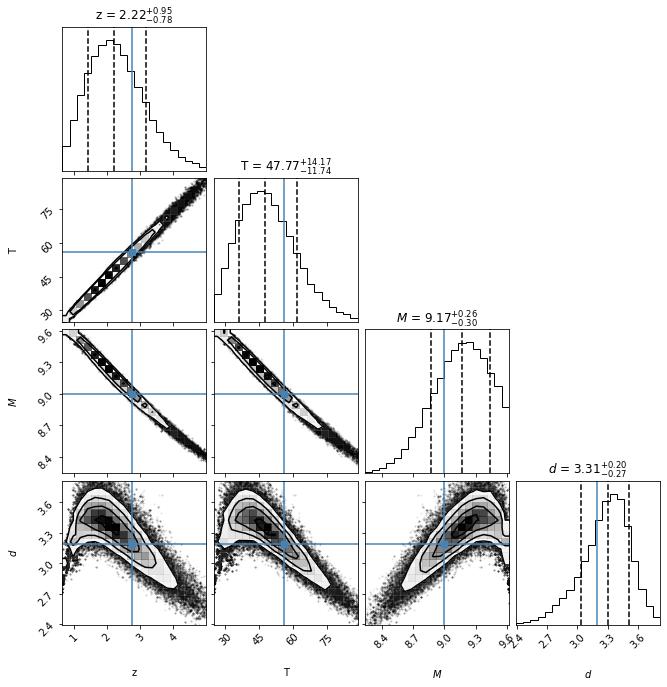

<Figure size 864x648 with 0 Axes>

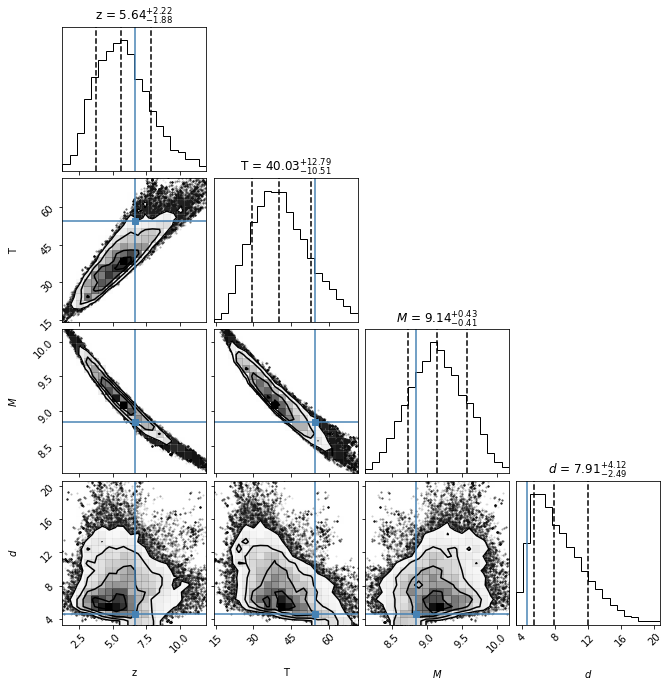

<Figure size 864x648 with 0 Axes>

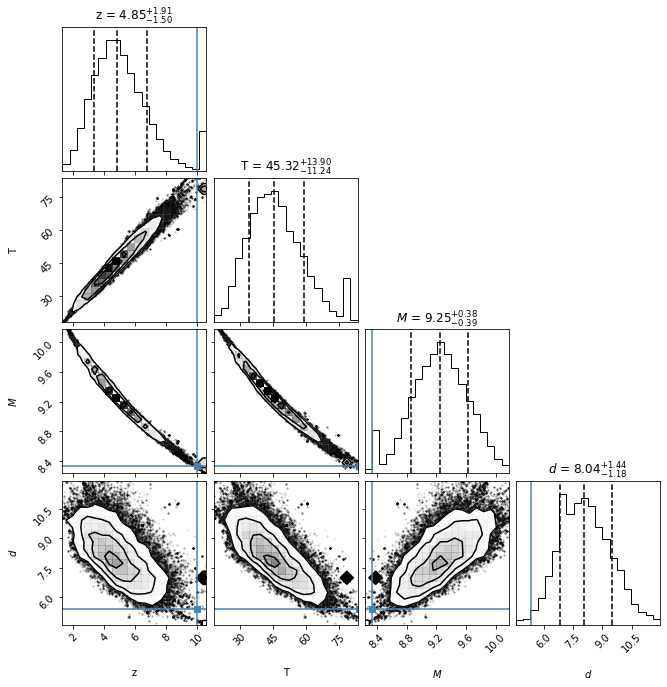

<Figure size 864x648 with 0 Axes>

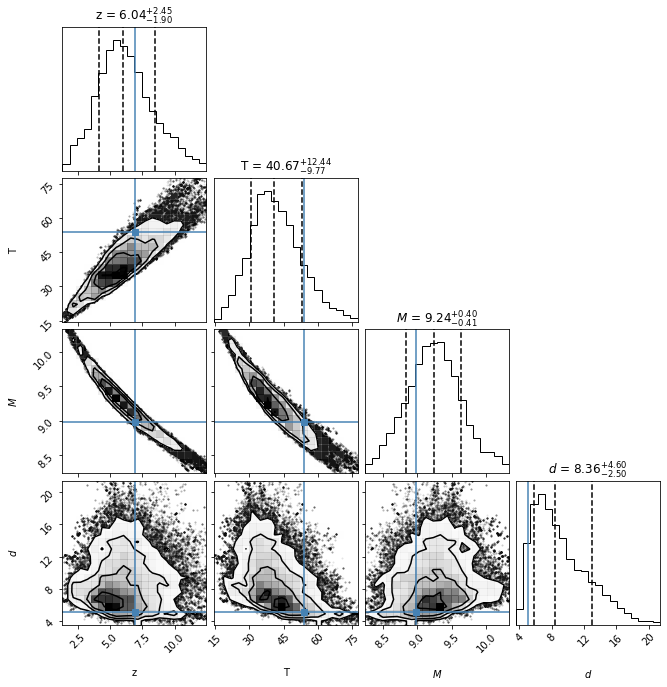

<Figure size 864x648 with 0 Axes>

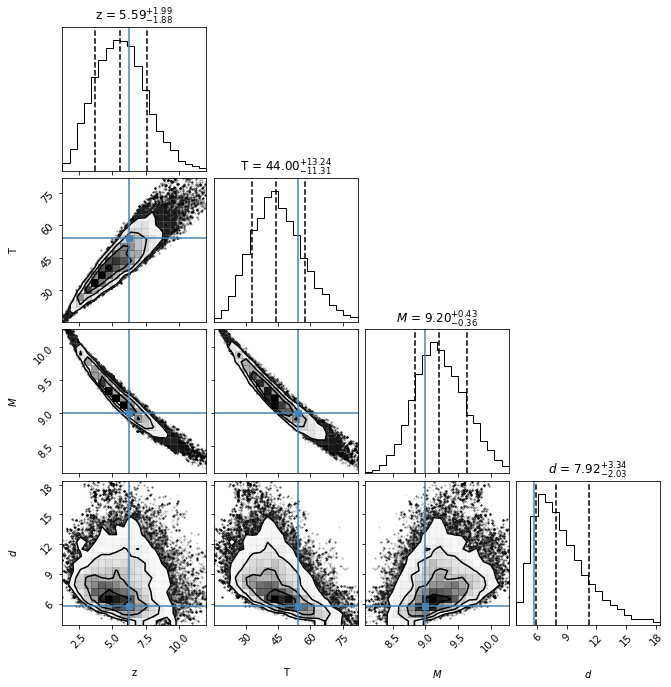

<Figure size 864x648 with 0 Axes>

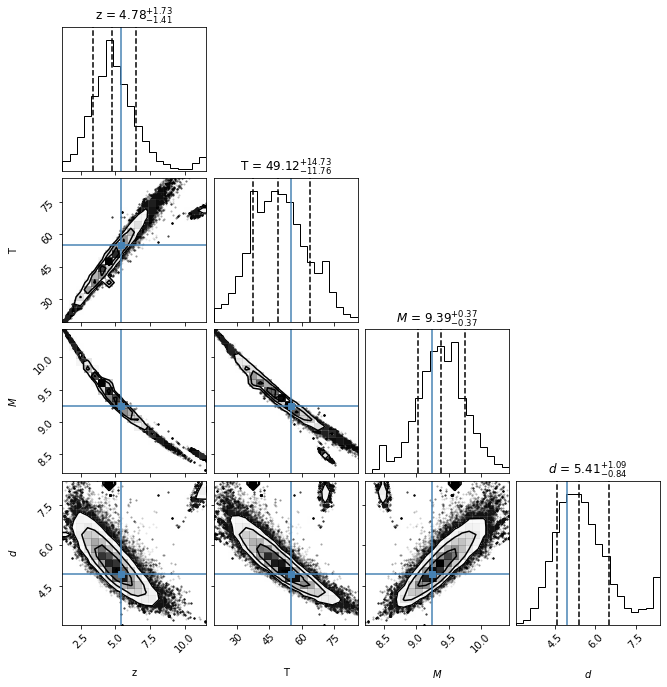

<Figure size 864x648 with 0 Axes>

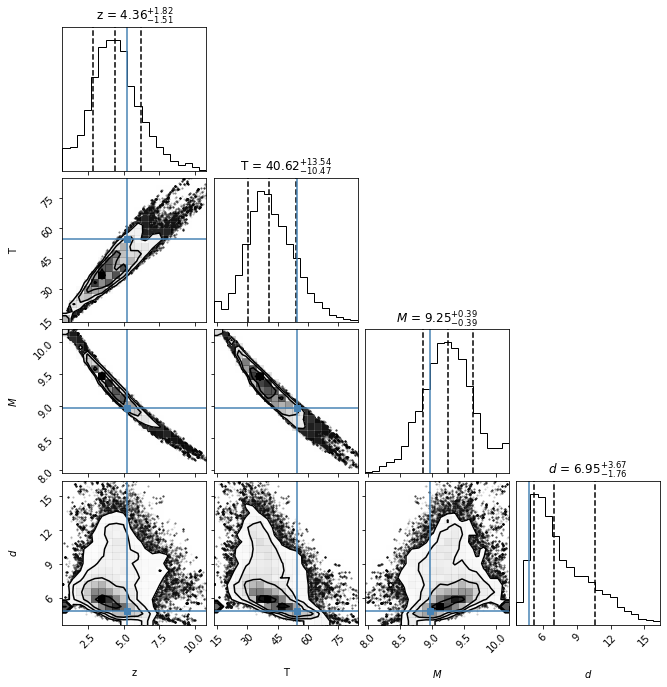

<Figure size 864x648 with 0 Axes>

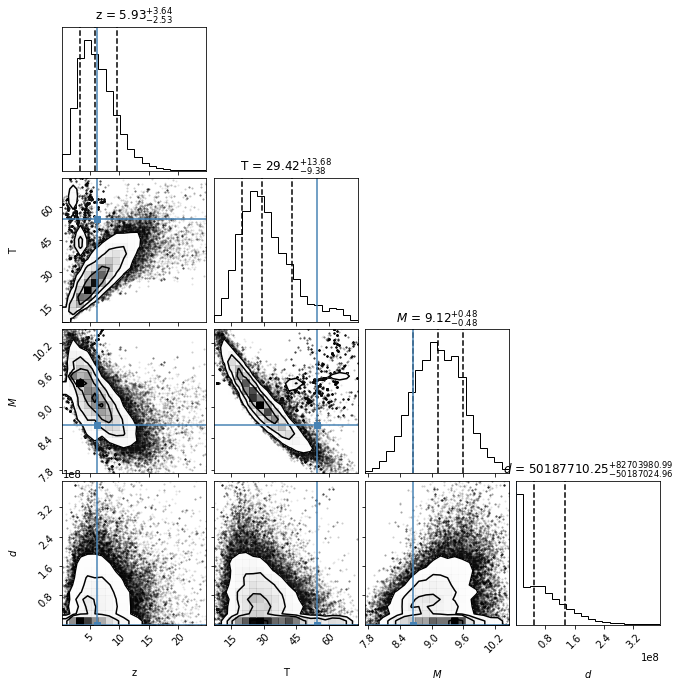

<Figure size 864x648 with 0 Axes>

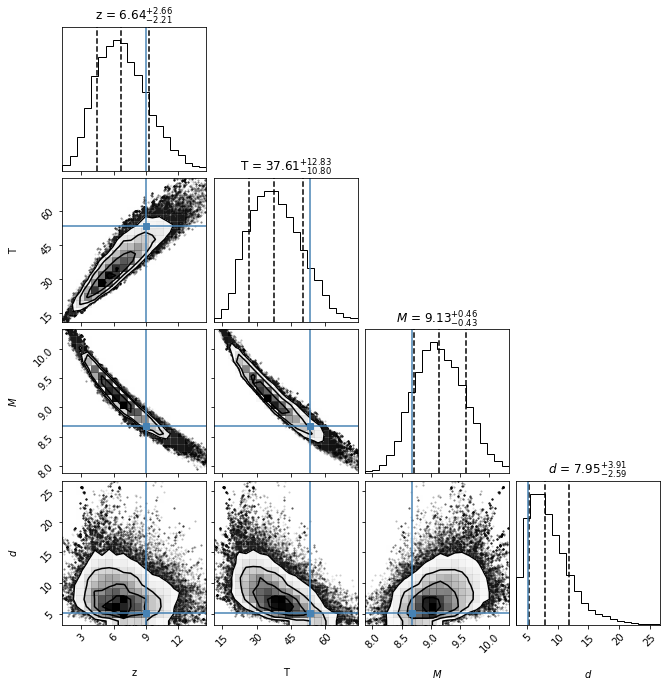

<Figure size 864x648 with 0 Axes>

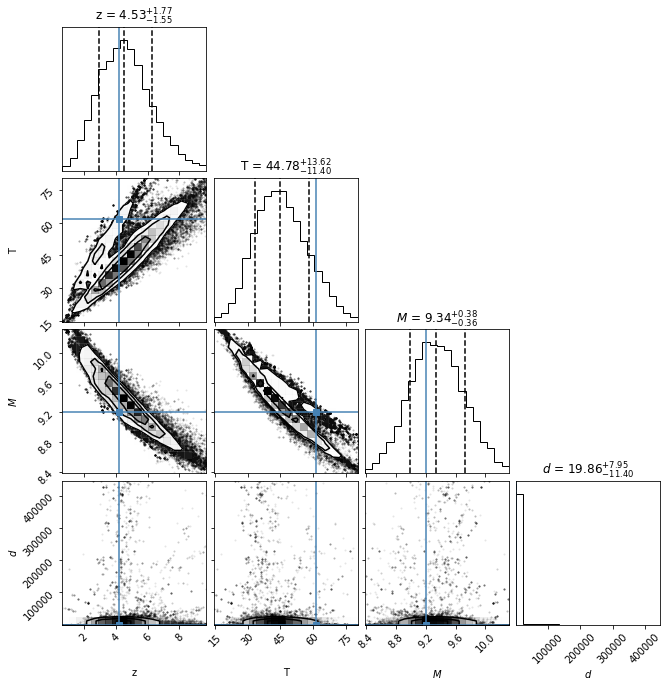

<Figure size 864x648 with 0 Axes>

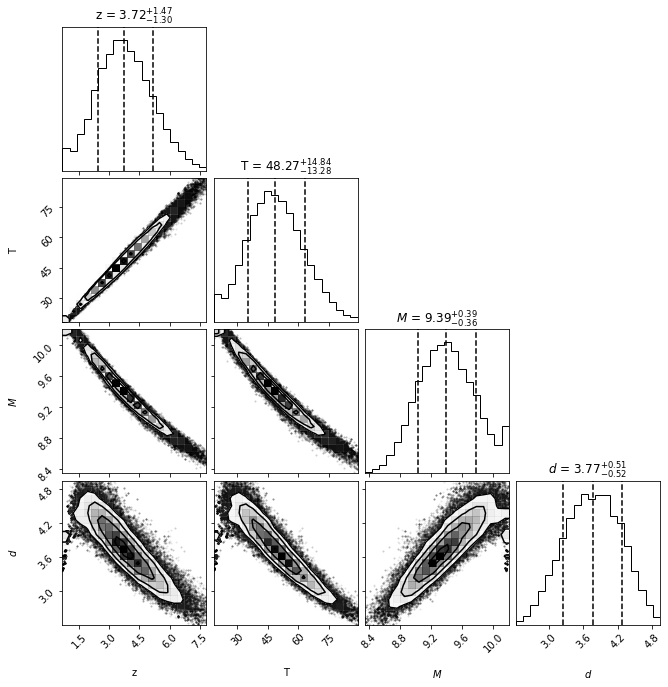

<Figure size 864x648 with 0 Axes>

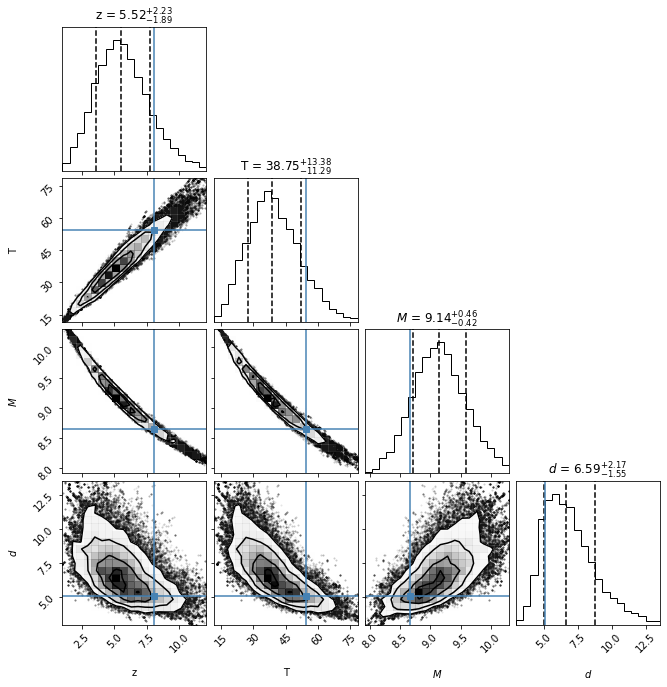

<Figure size 864x648 with 0 Axes>

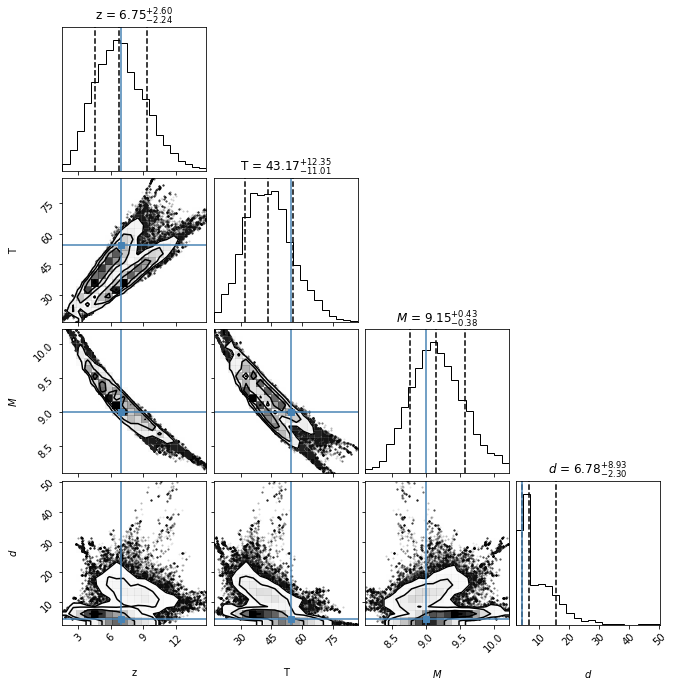

<Figure size 864x648 with 0 Axes>

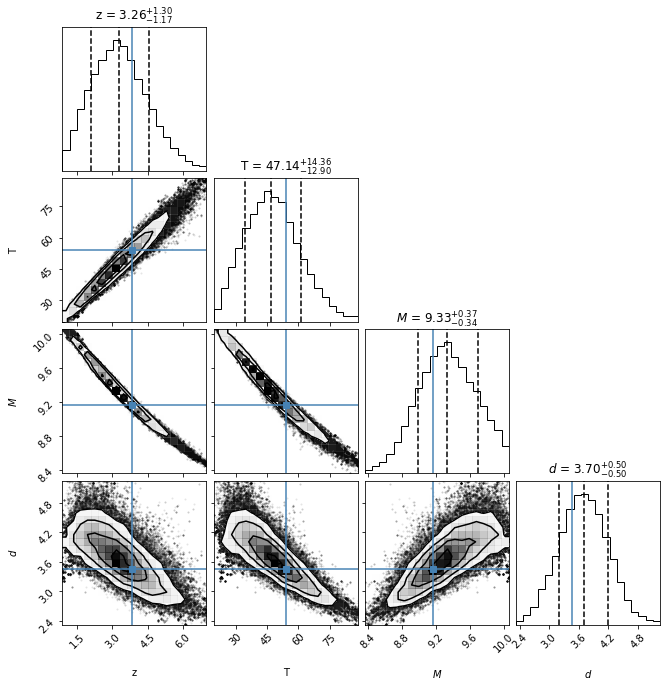

<Figure size 864x648 with 0 Axes>

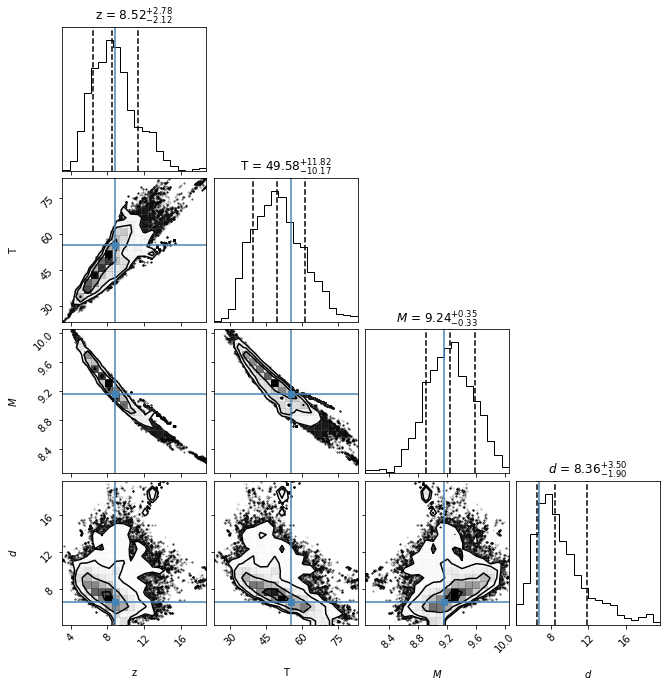

<Figure size 864x648 with 0 Axes>

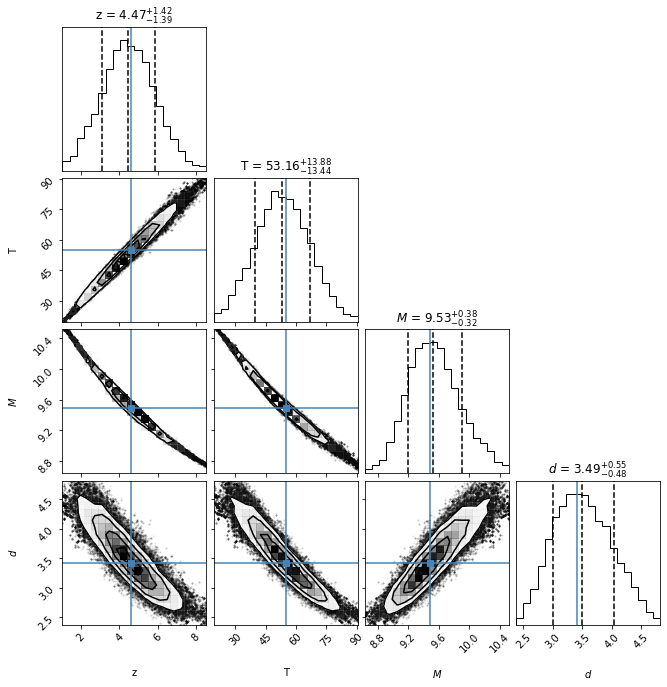

<Figure size 864x648 with 0 Axes>

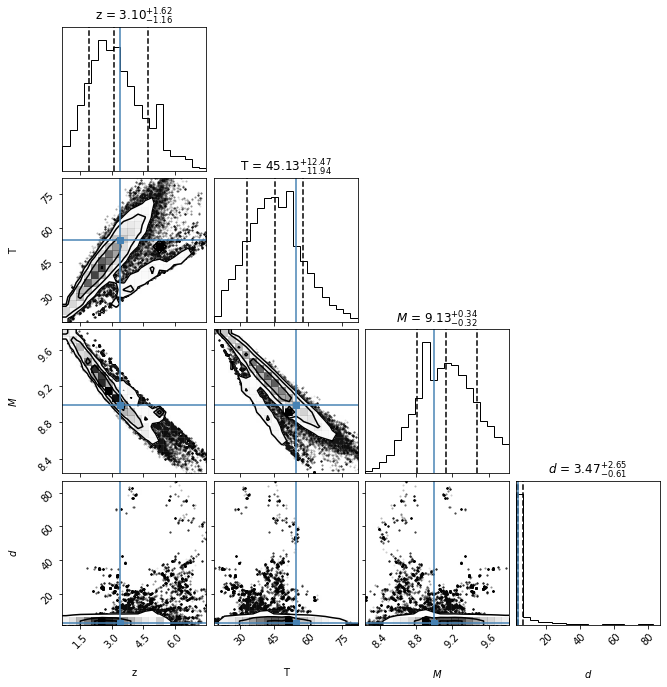

<Figure size 864x648 with 0 Axes>

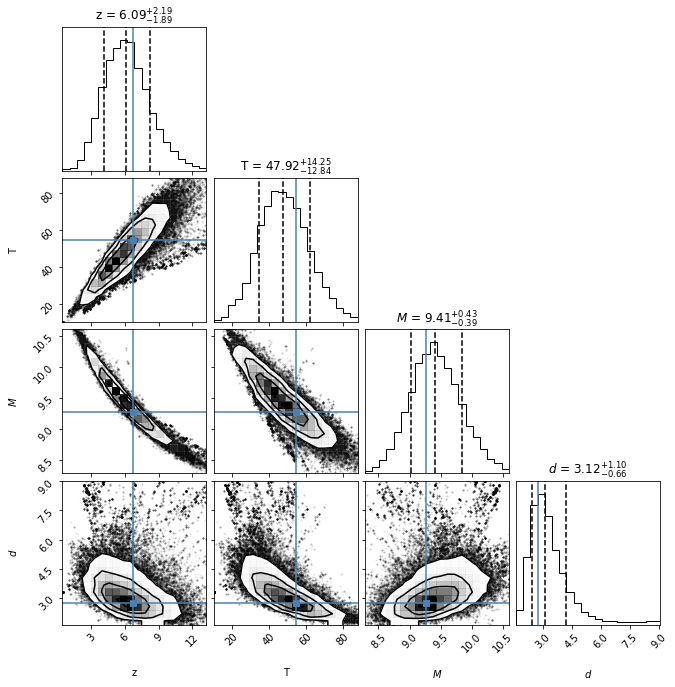

<Figure size 864x648 with 0 Axes>

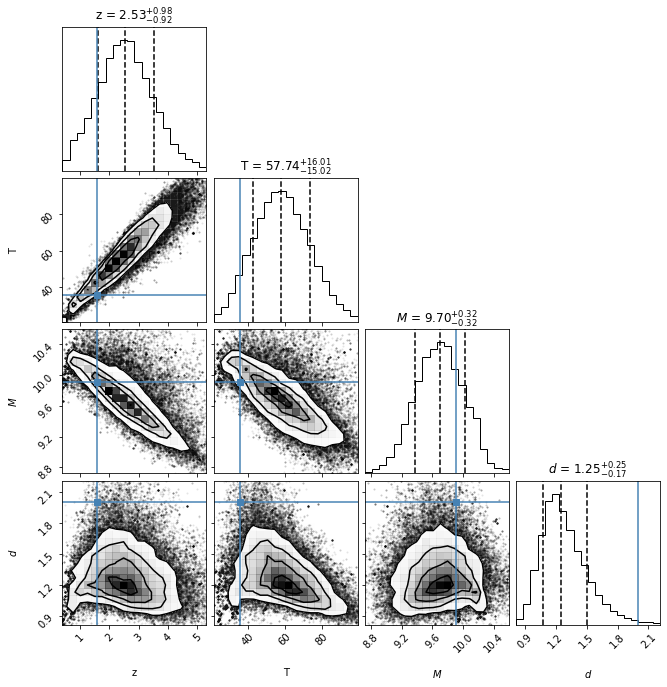

<Figure size 864x648 with 0 Axes>

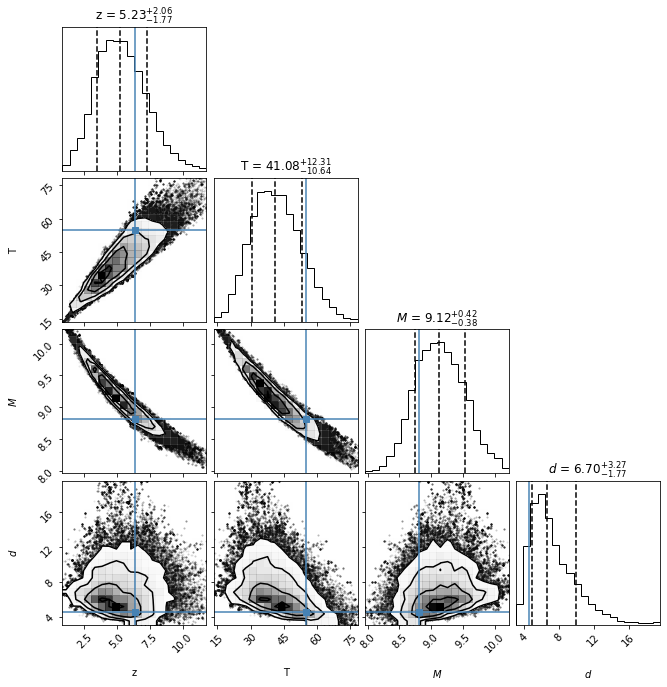

<Figure size 864x648 with 0 Axes>

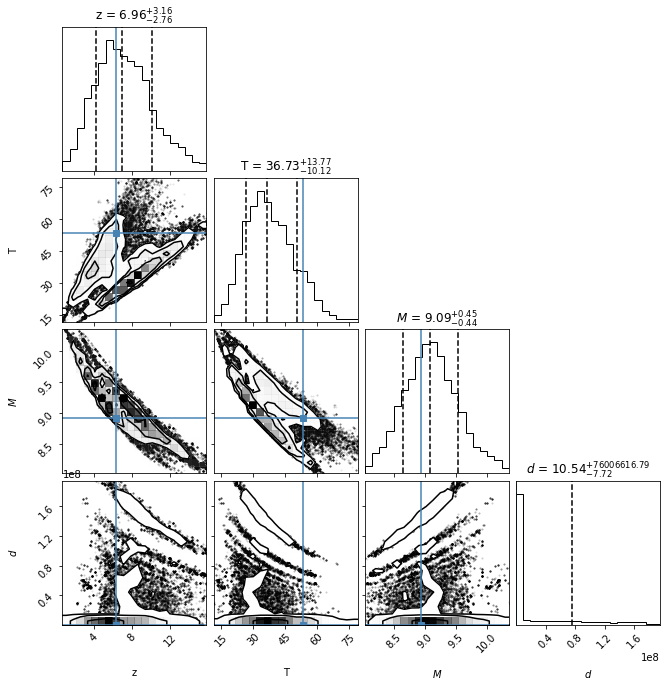

<Figure size 864x648 with 0 Axes>

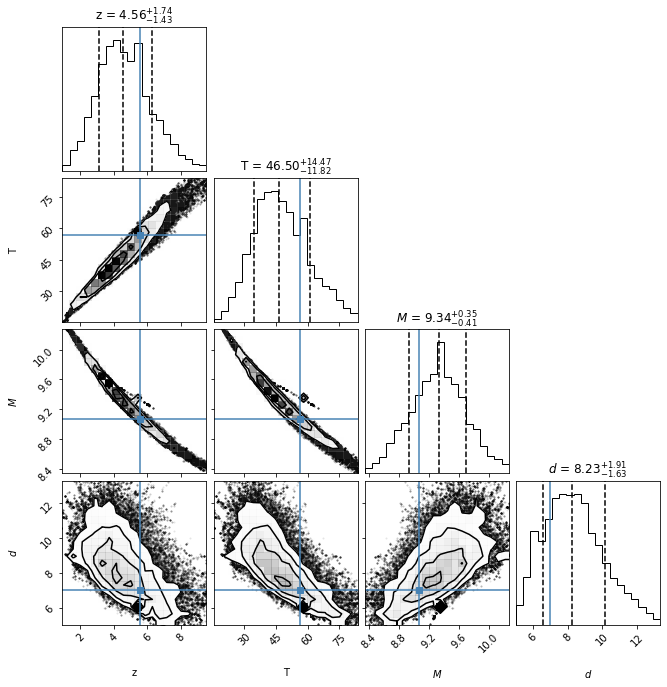

<Figure size 864x648 with 0 Axes>

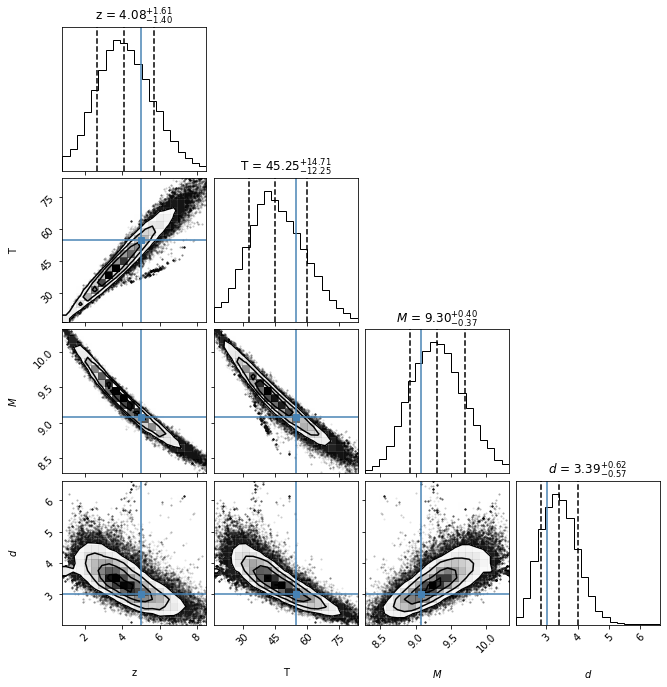

<Figure size 864x648 with 0 Axes>

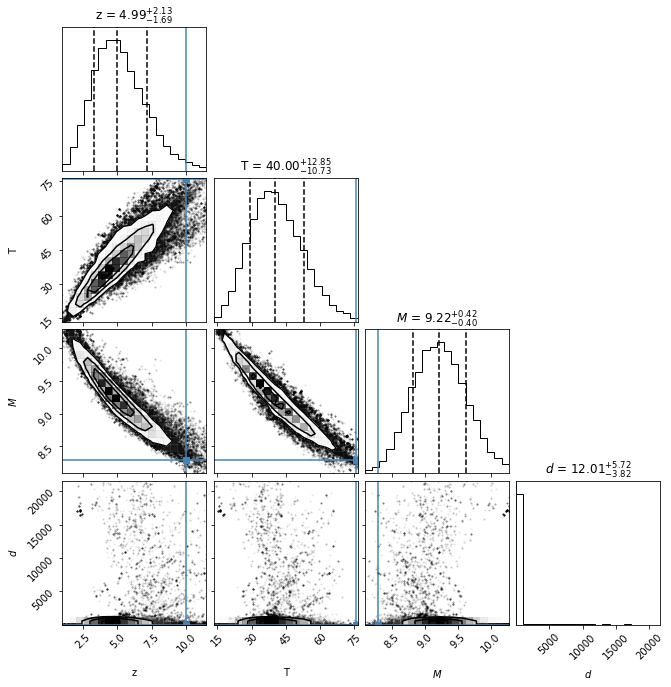

<Figure size 864x648 with 0 Axes>

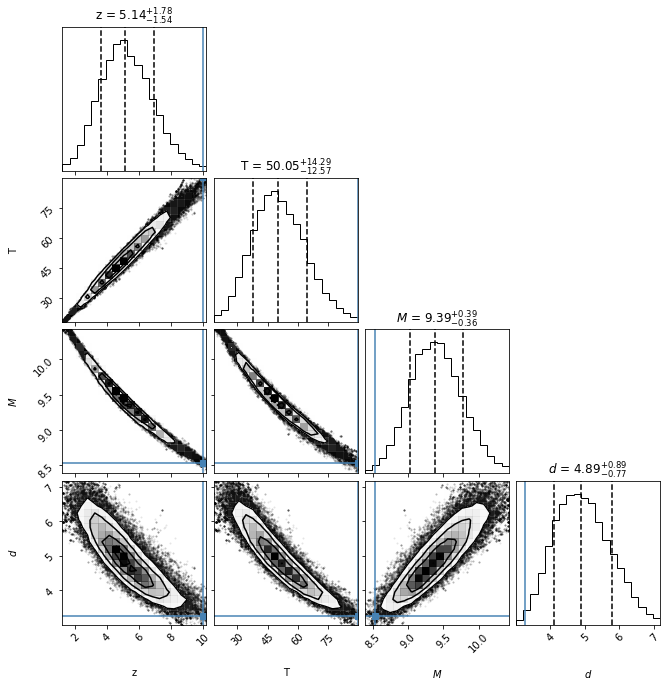

<Figure size 864x648 with 0 Axes>

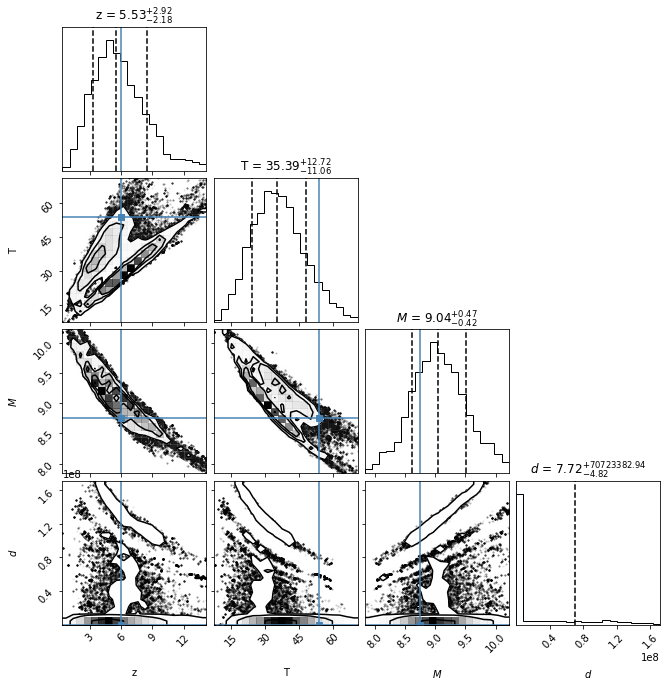

<Figure size 864x648 with 0 Axes>

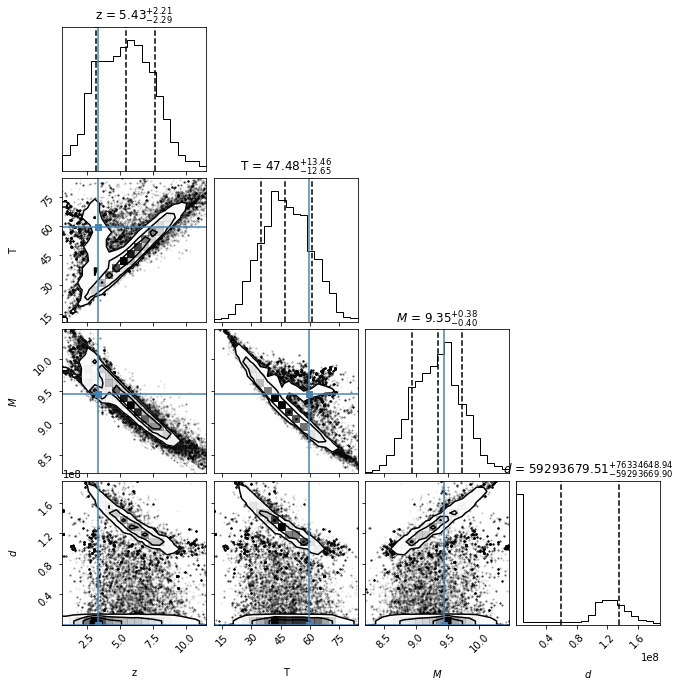

<Figure size 864x648 with 0 Axes>

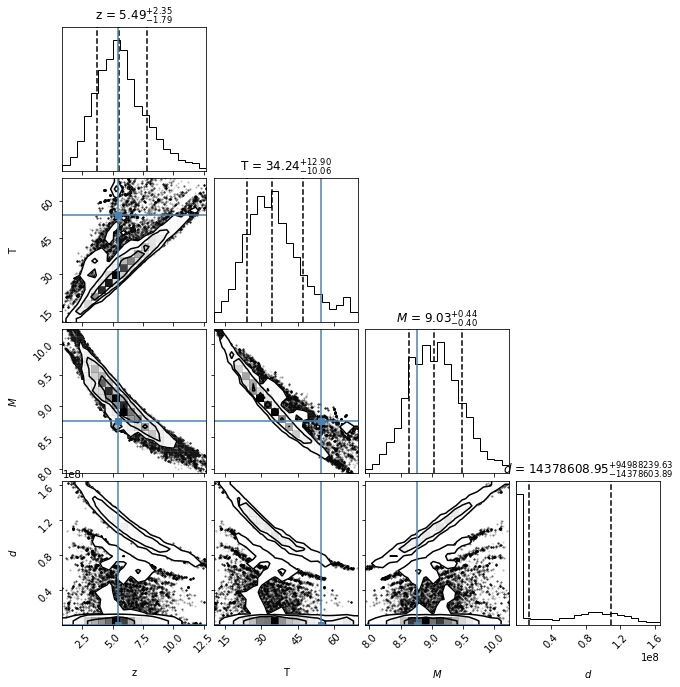

<Figure size 864x648 with 0 Axes>

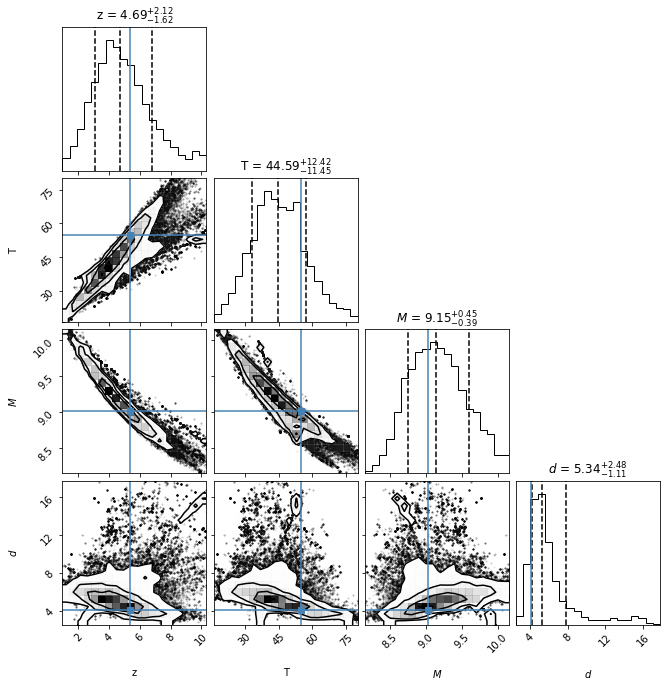

<Figure size 864x648 with 0 Axes>

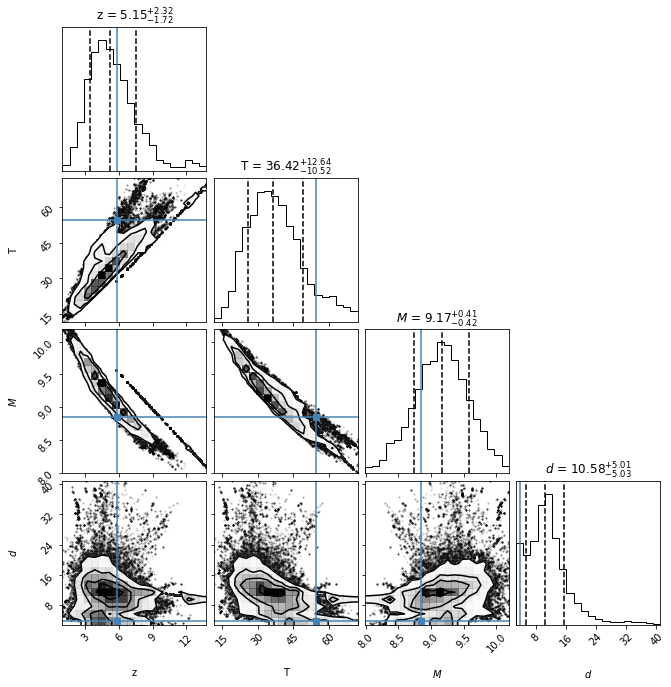

<Figure size 864x648 with 0 Axes>

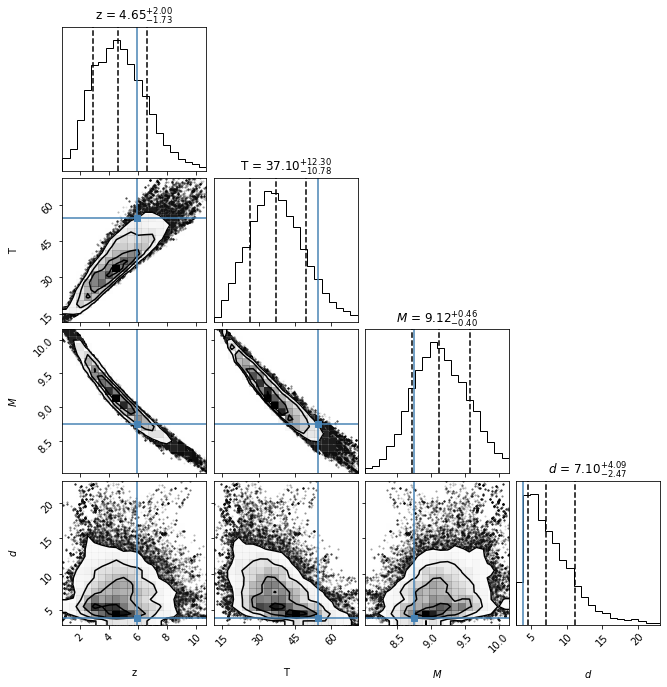

<Figure size 864x648 with 0 Axes>

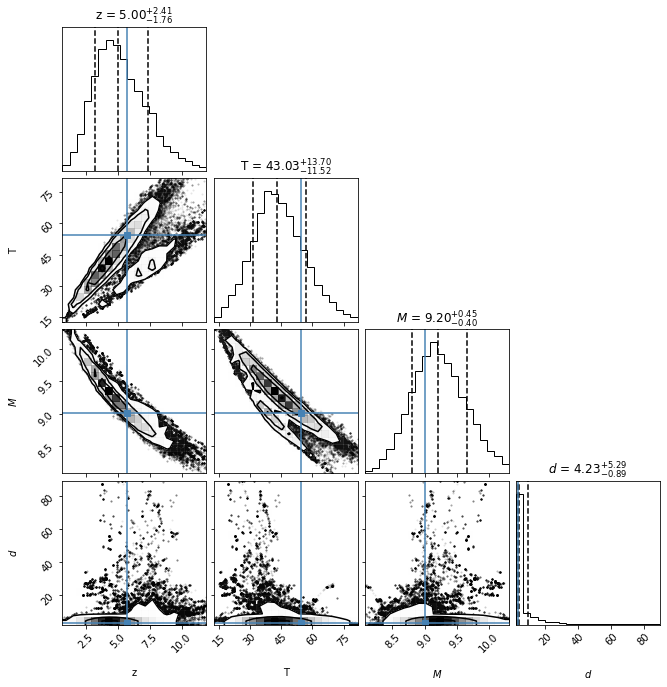

<Figure size 864x648 with 0 Axes>

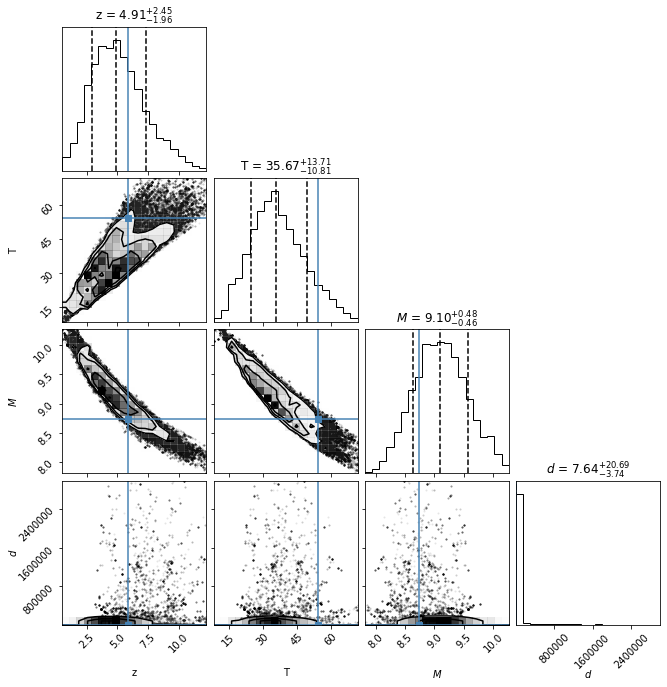

<Figure size 864x648 with 0 Axes>

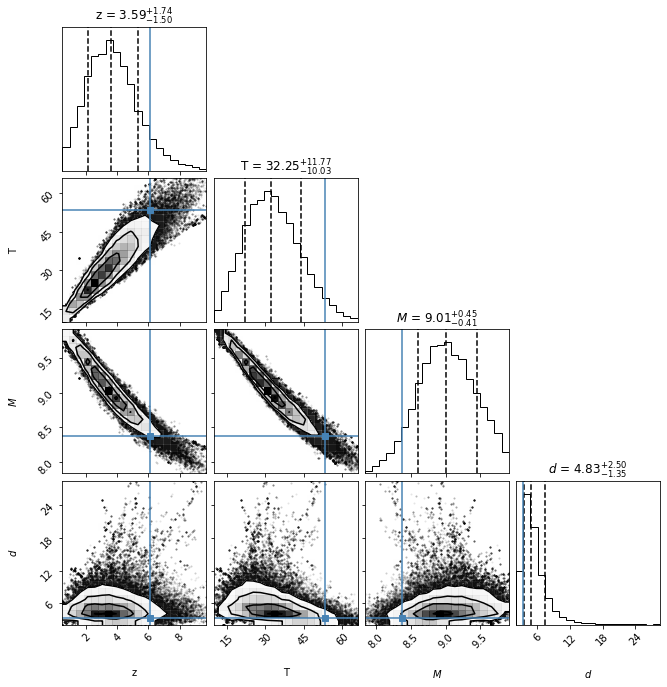

<Figure size 864x648 with 0 Axes>

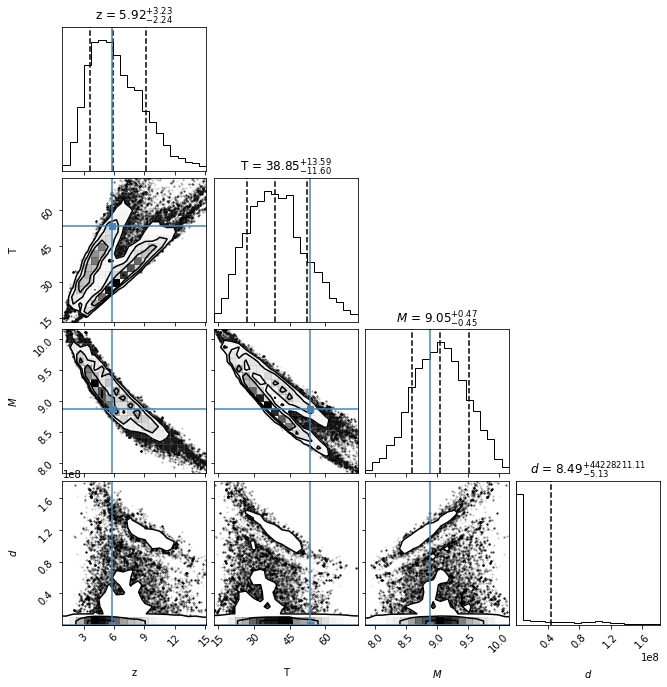

<Figure size 864x648 with 0 Axes>

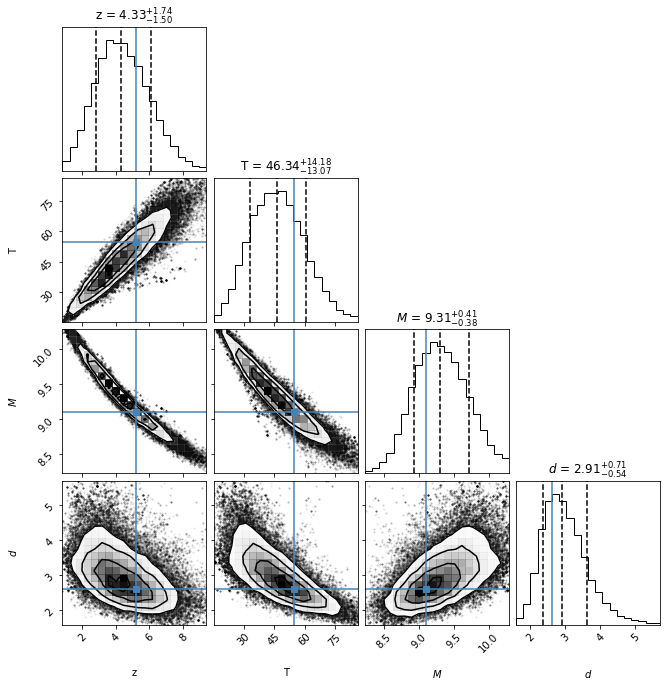

<Figure size 864x648 with 0 Axes>

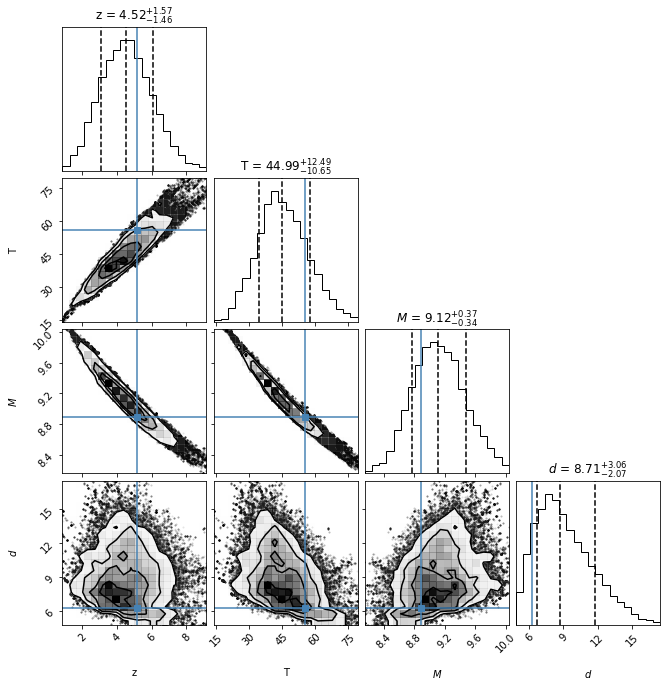

<Figure size 864x648 with 0 Axes>

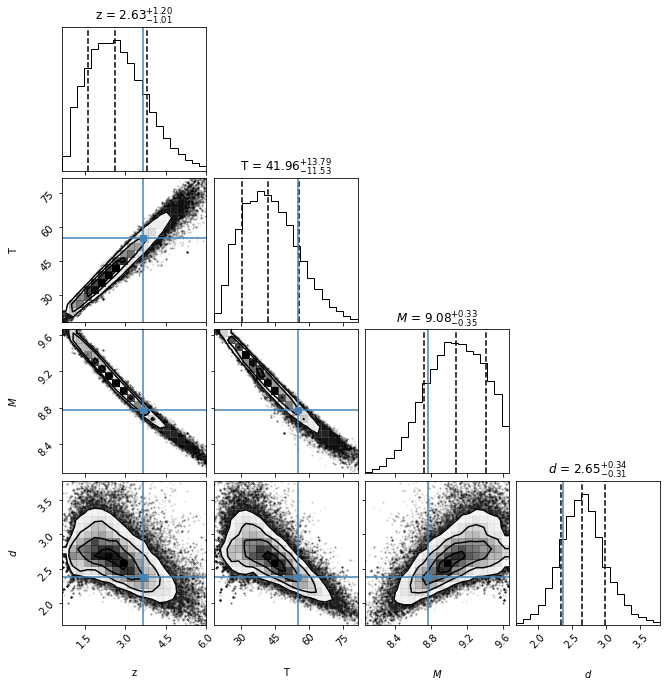

<Figure size 864x648 with 0 Axes>

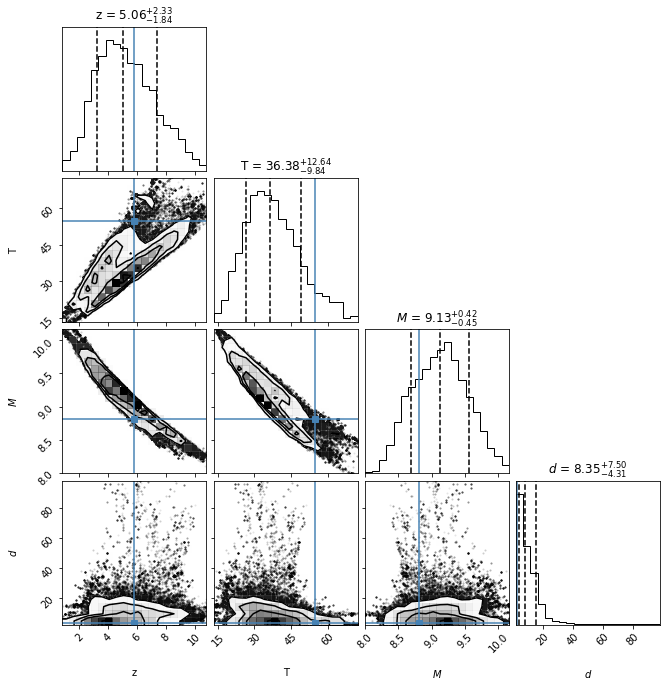

<Figure size 864x648 with 0 Axes>

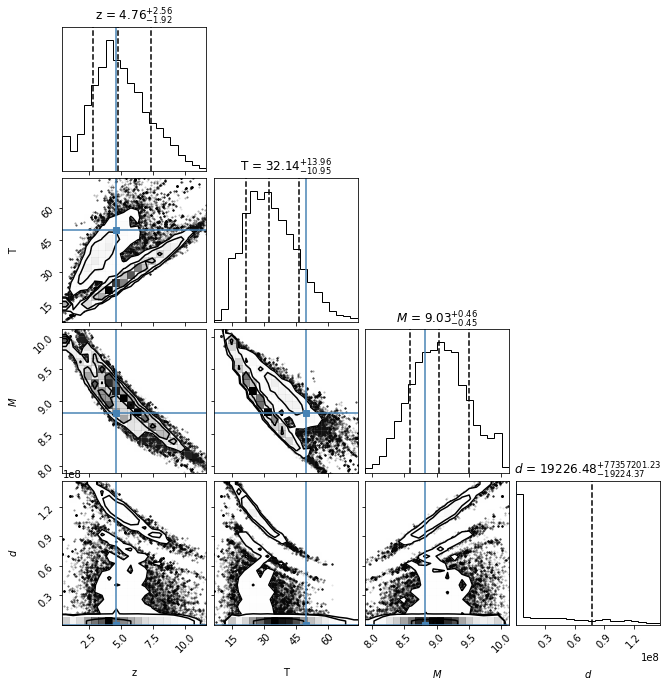

<Figure size 864x648 with 0 Axes>

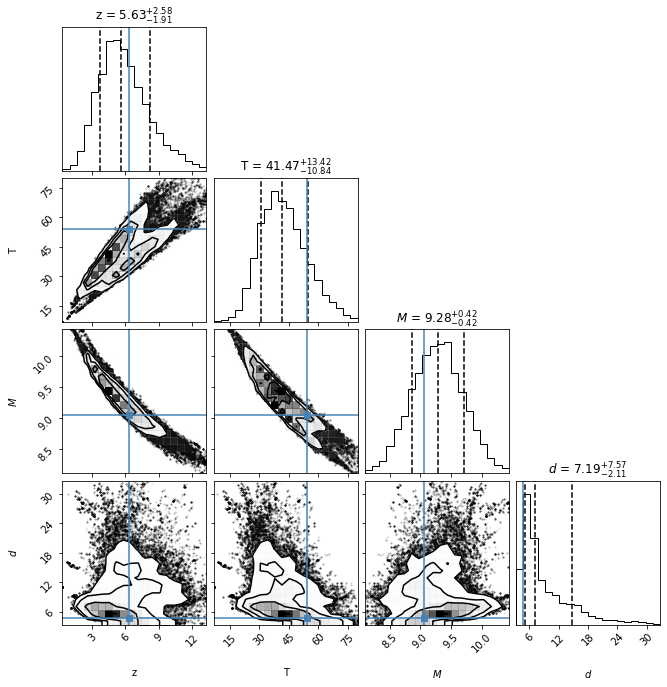

<Figure size 864x648 with 0 Axes>

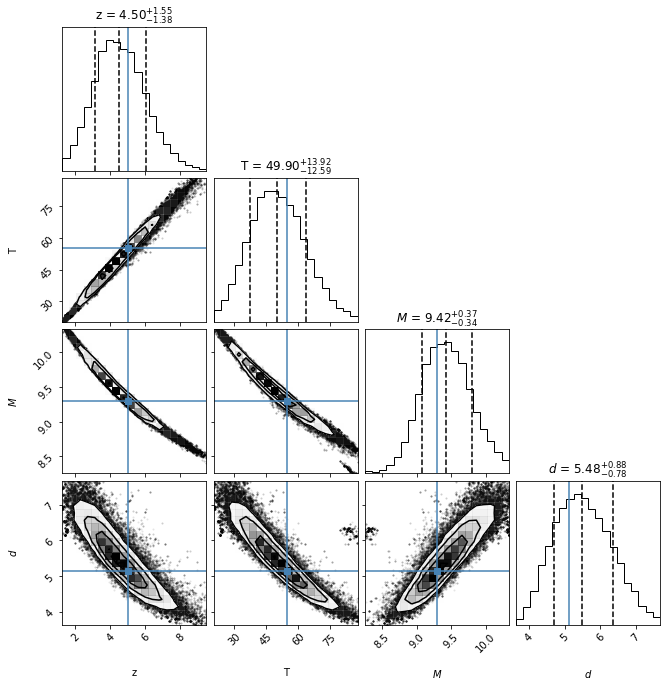

<Figure size 864x648 with 0 Axes>

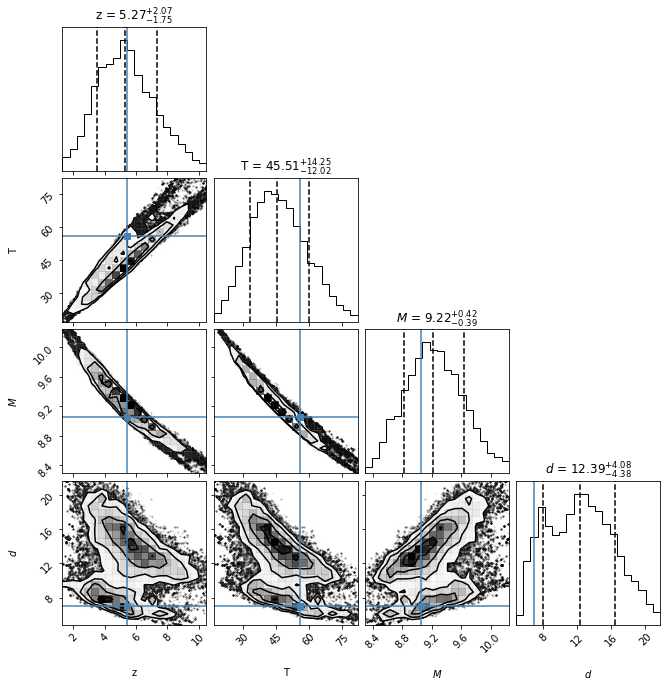

<Figure size 864x648 with 0 Axes>

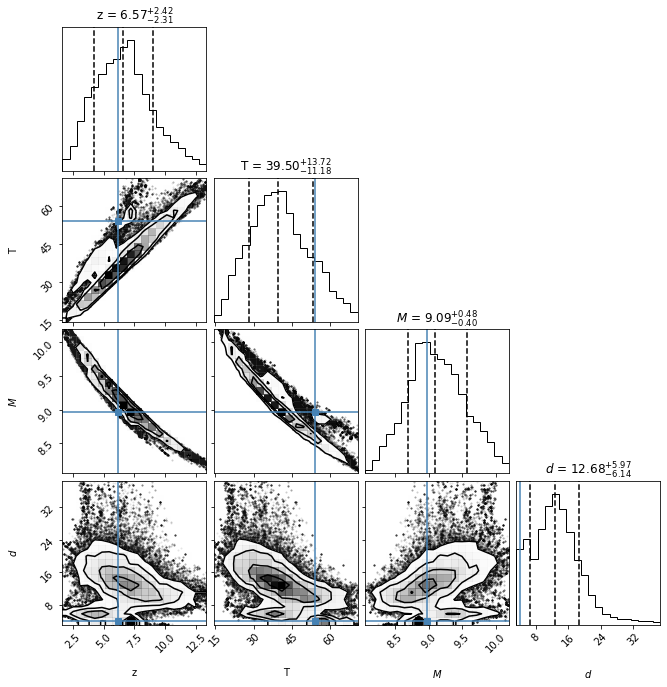

<Figure size 864x648 with 0 Axes>

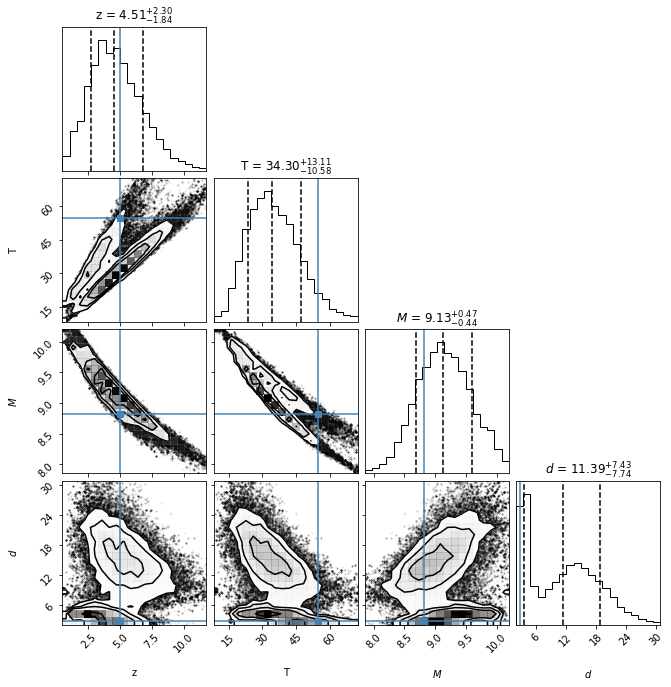

<Figure size 864x648 with 0 Axes>

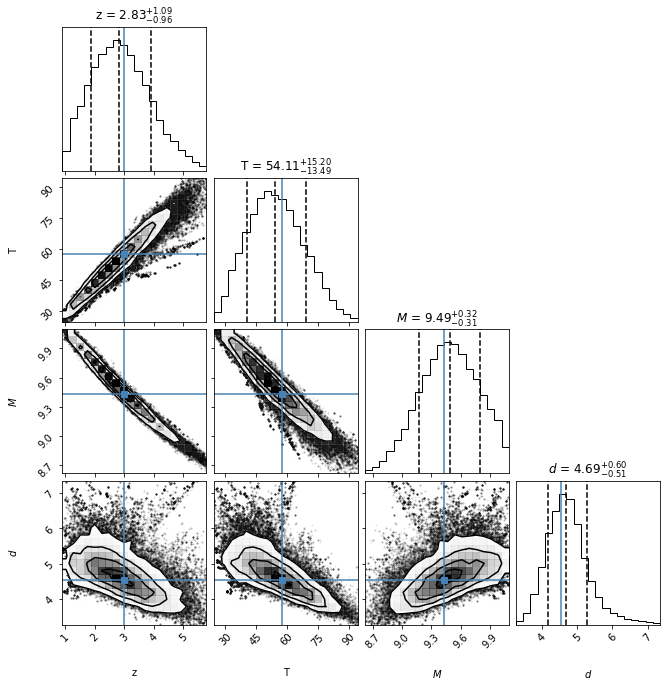

<Figure size 864x648 with 0 Axes>

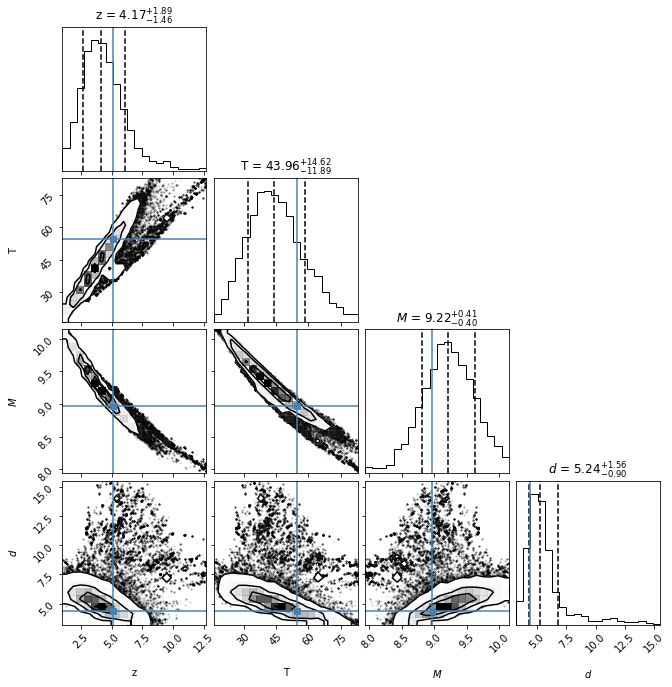

<Figure size 864x648 with 0 Axes>

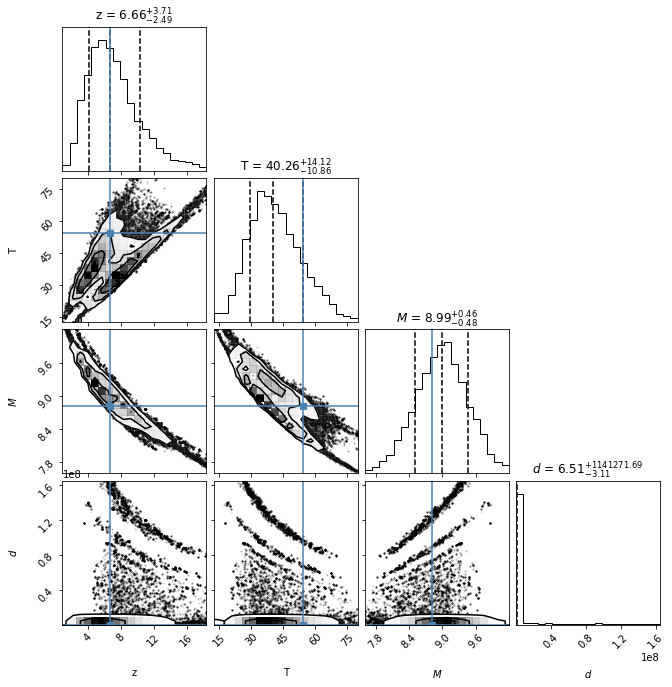

<Figure size 864x648 with 0 Axes>

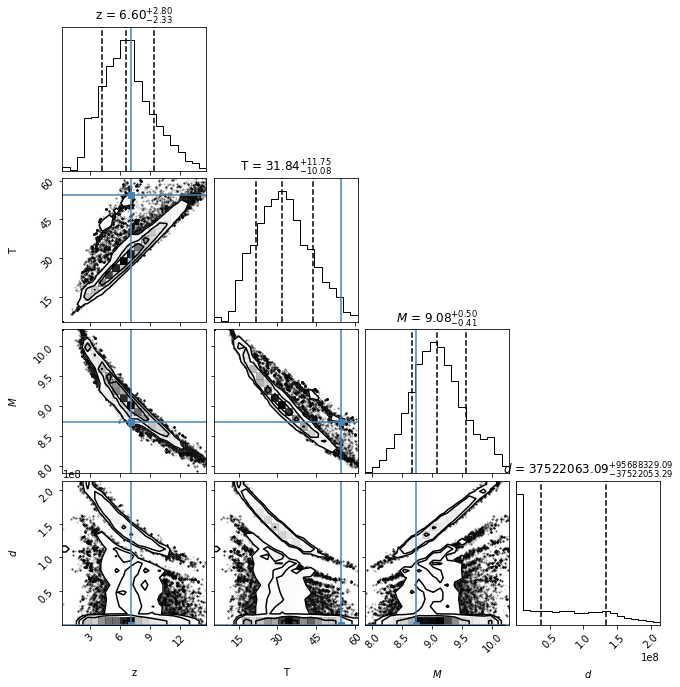

<Figure size 864x648 with 0 Axes>

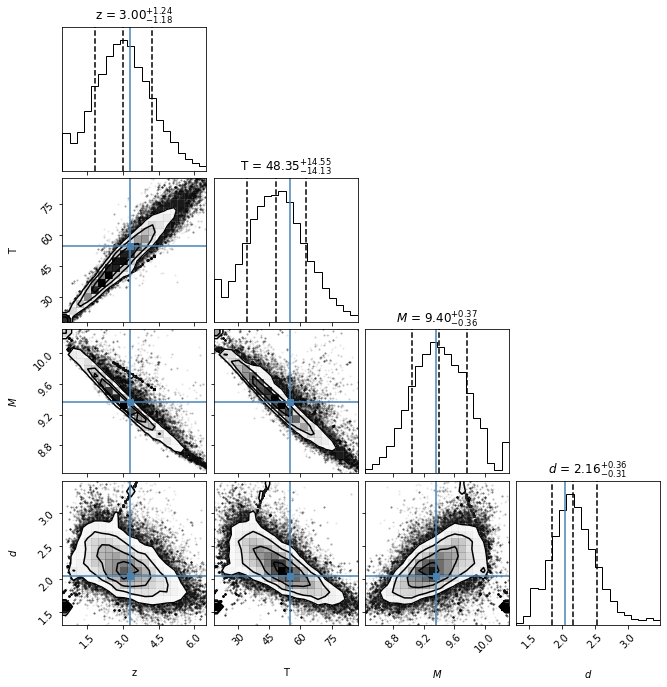

<Figure size 864x648 with 0 Axes>

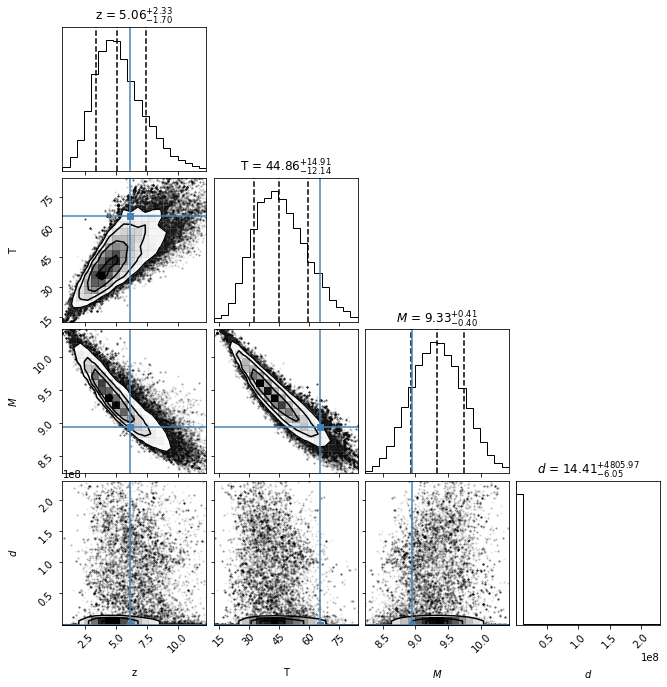

<Figure size 864x648 with 0 Axes>

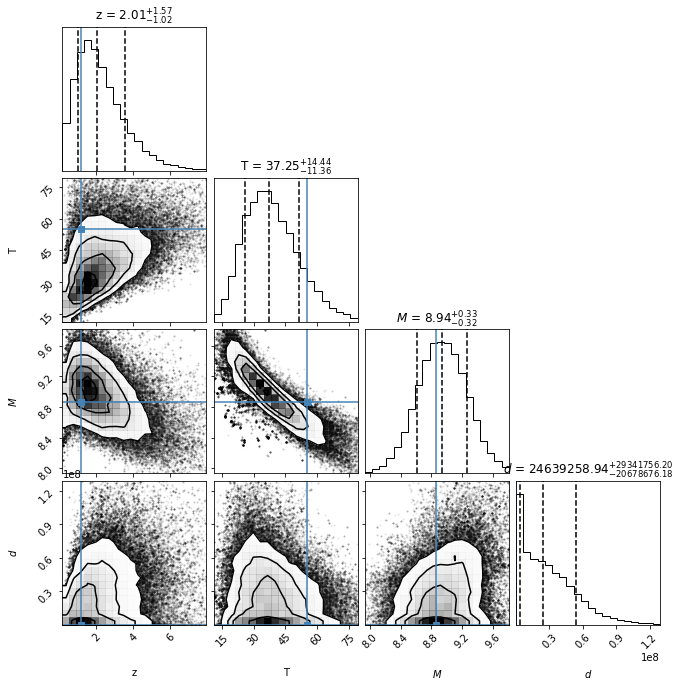

<Figure size 864x648 with 0 Axes>

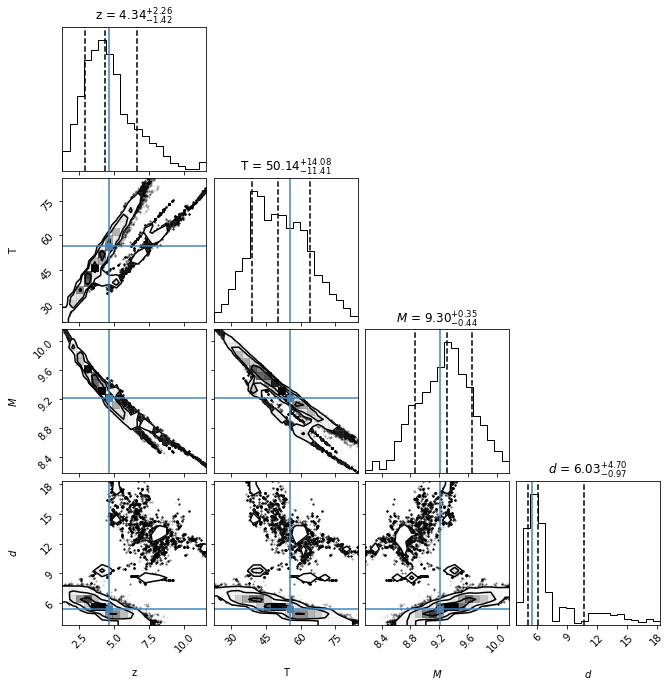

<Figure size 864x648 with 0 Axes>

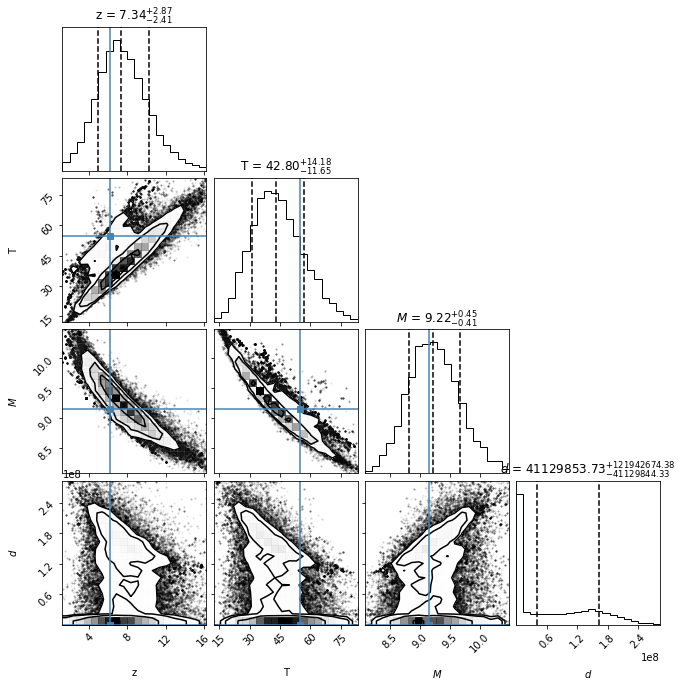

<Figure size 864x648 with 0 Axes>

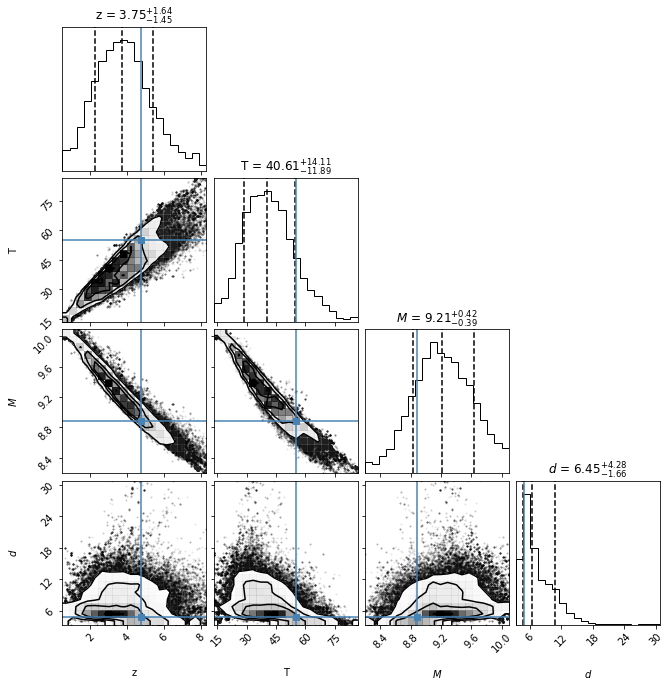

<Figure size 864x648 with 0 Axes>

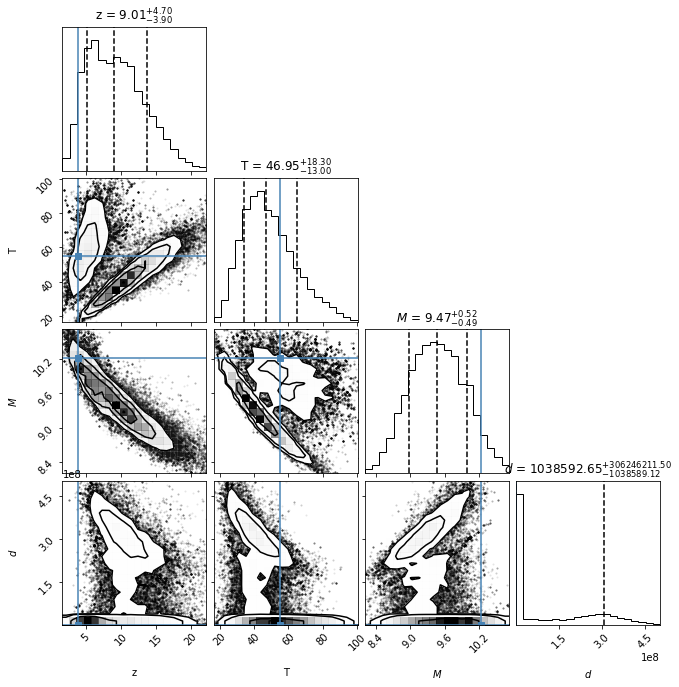

<Figure size 864x648 with 0 Axes>

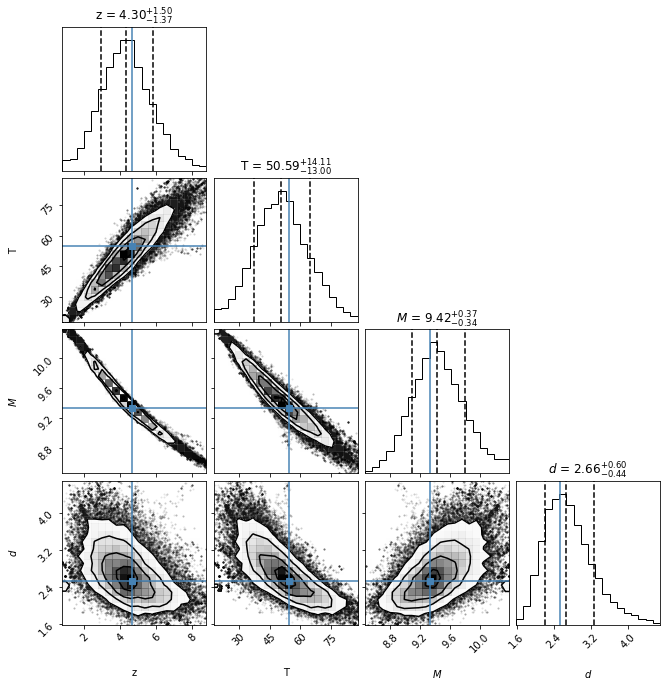

<Figure size 864x648 with 0 Axes>

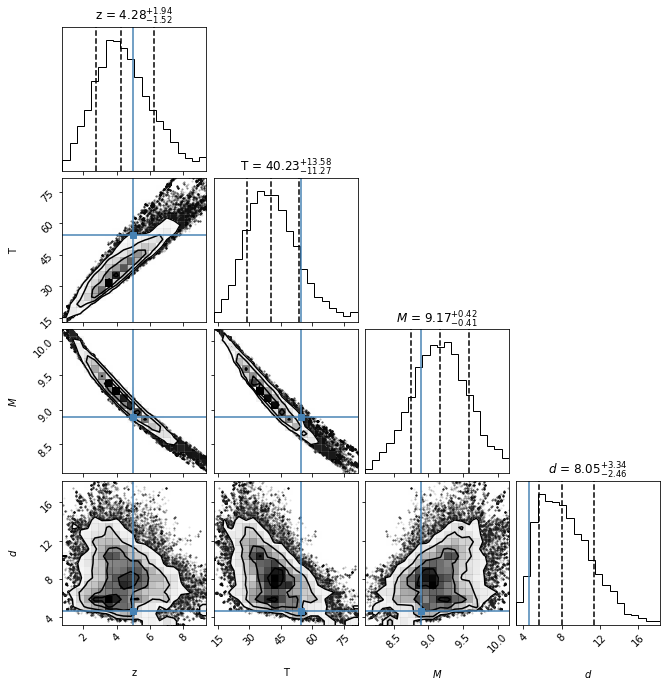

<Figure size 864x648 with 0 Axes>

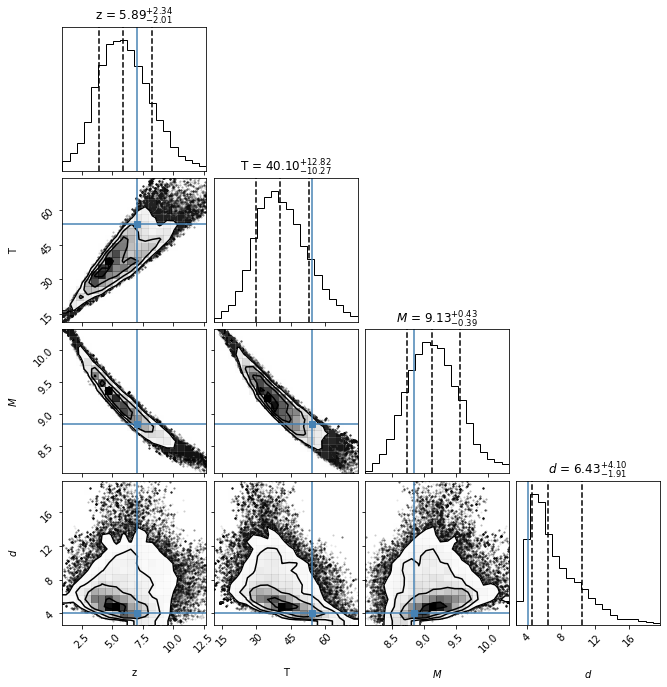

<Figure size 864x648 with 0 Axes>

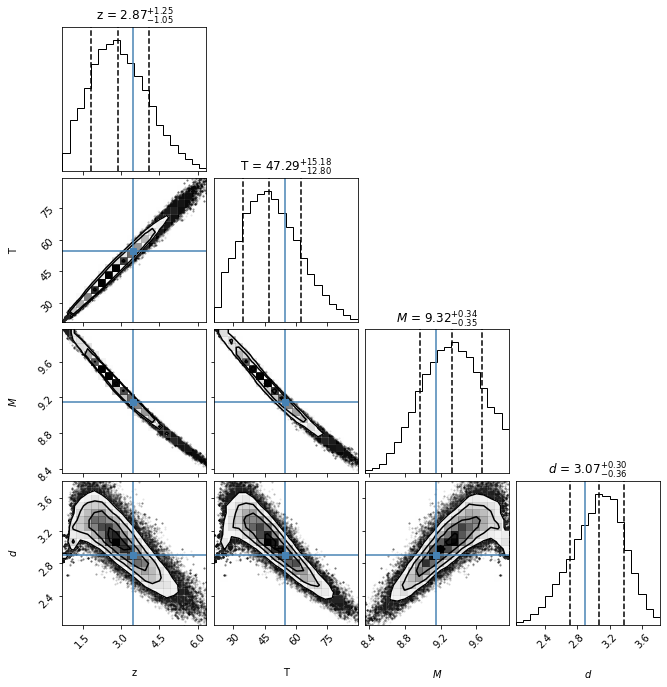

<Figure size 864x648 with 0 Axes>

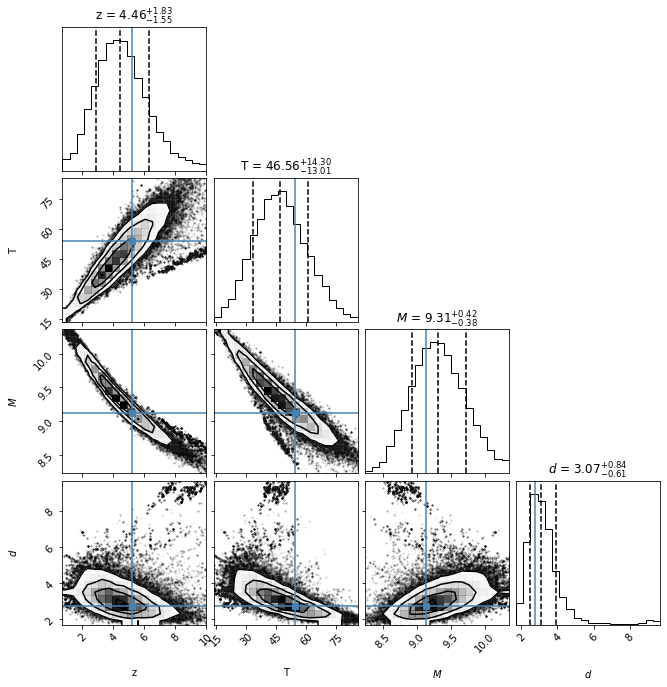

<Figure size 864x648 with 0 Axes>

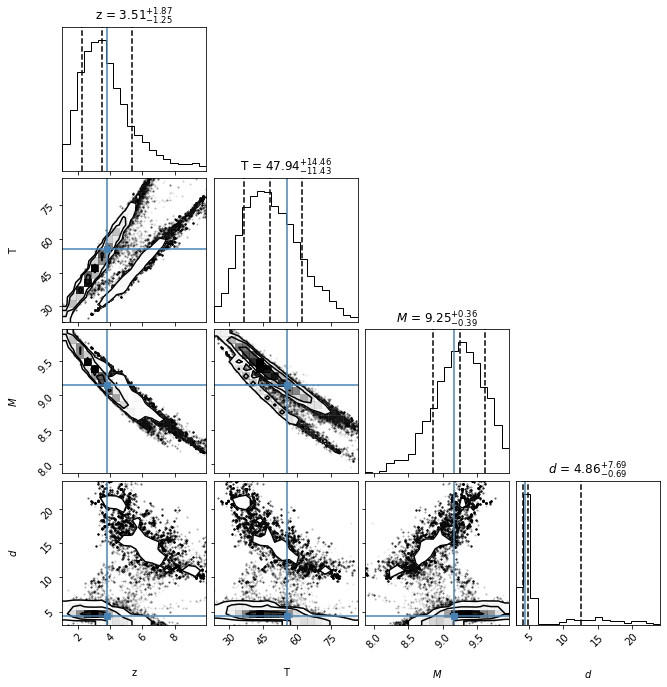

<Figure size 864x648 with 0 Axes>

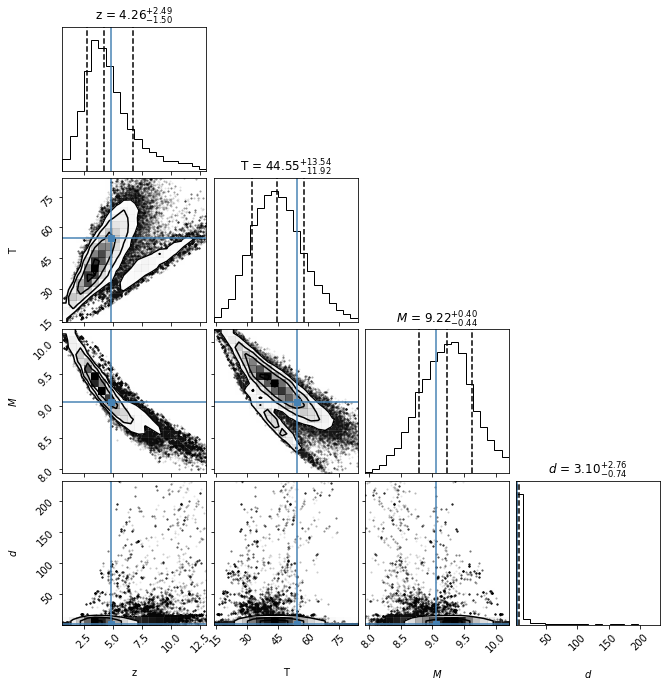

<Figure size 864x648 with 0 Axes>

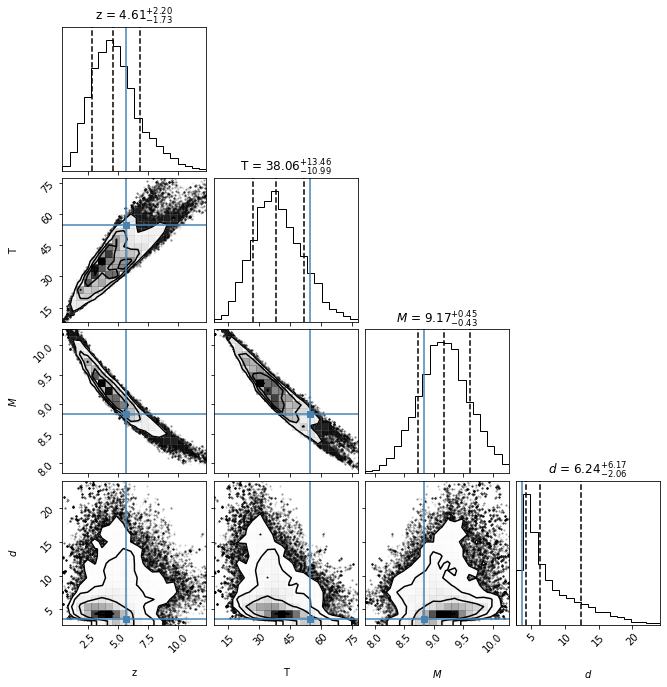

<Figure size 864x648 with 0 Axes>

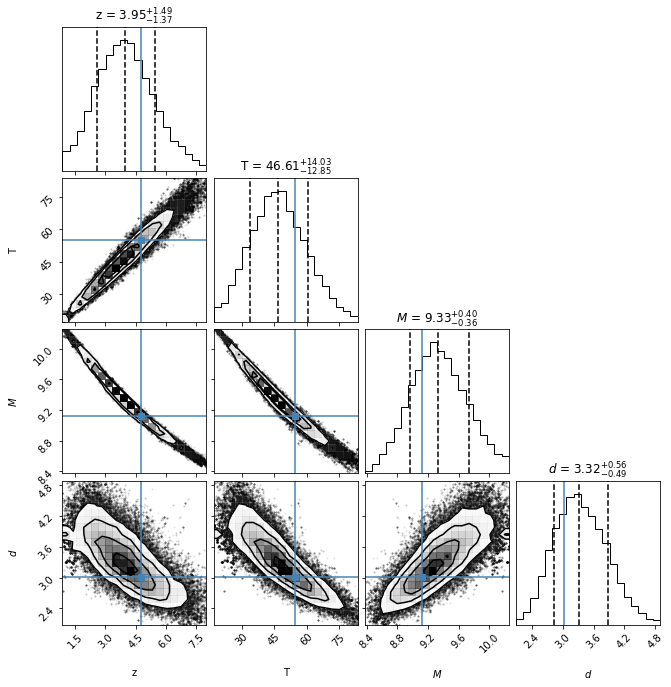

<Figure size 864x648 with 0 Axes>

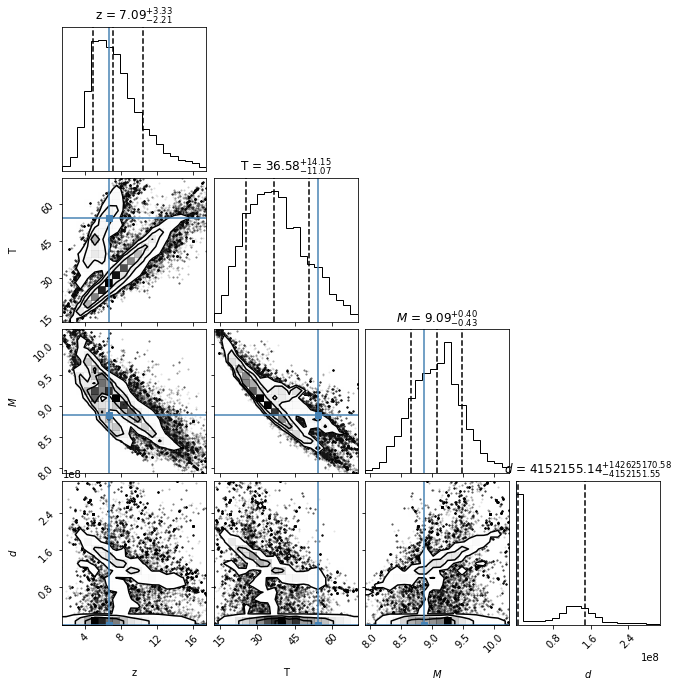

<Figure size 864x648 with 0 Axes>

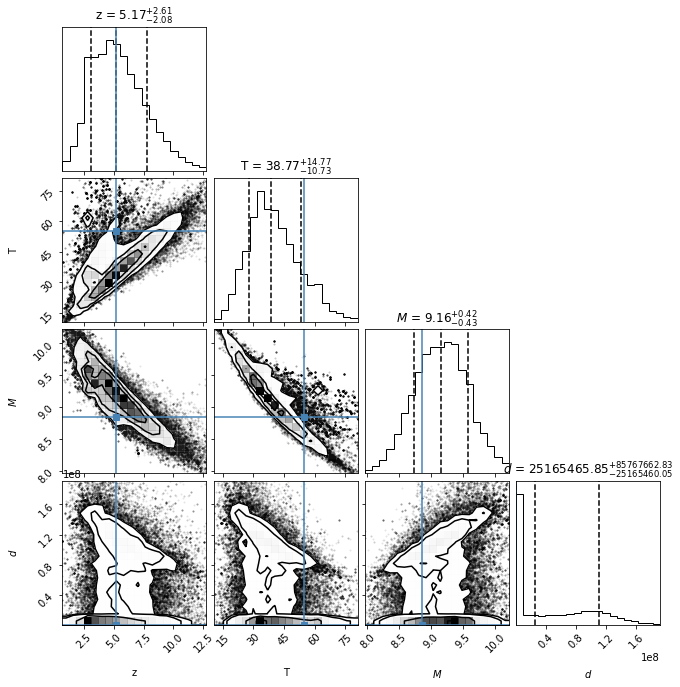

<Figure size 864x648 with 0 Axes>

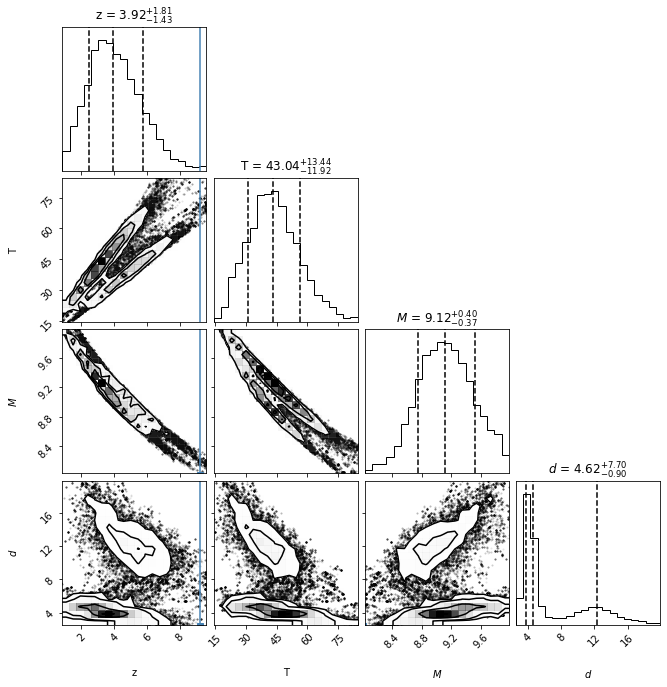

<Figure size 864x648 with 0 Axes>

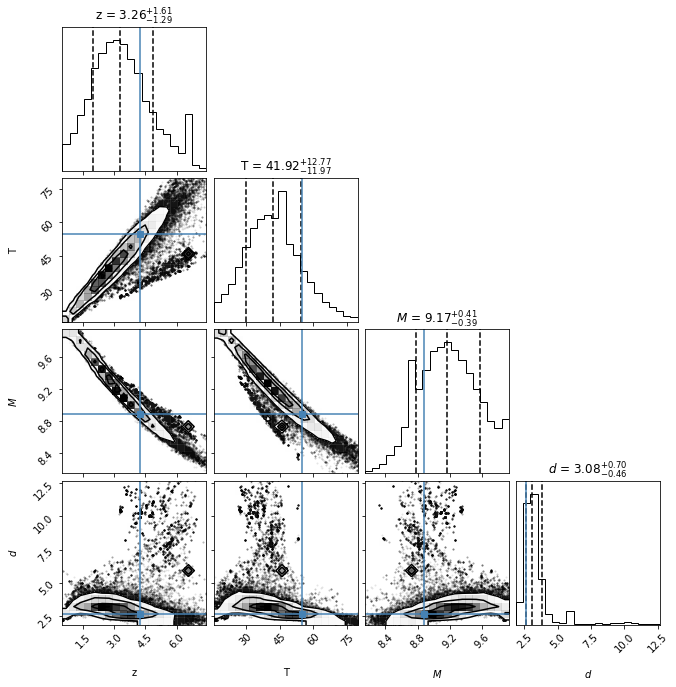

<Figure size 864x648 with 0 Axes>

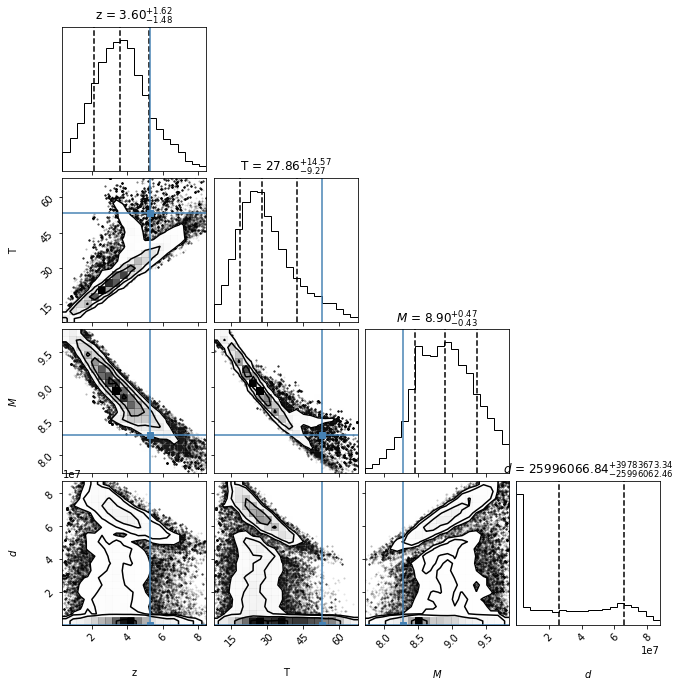

<Figure size 864x648 with 0 Axes>

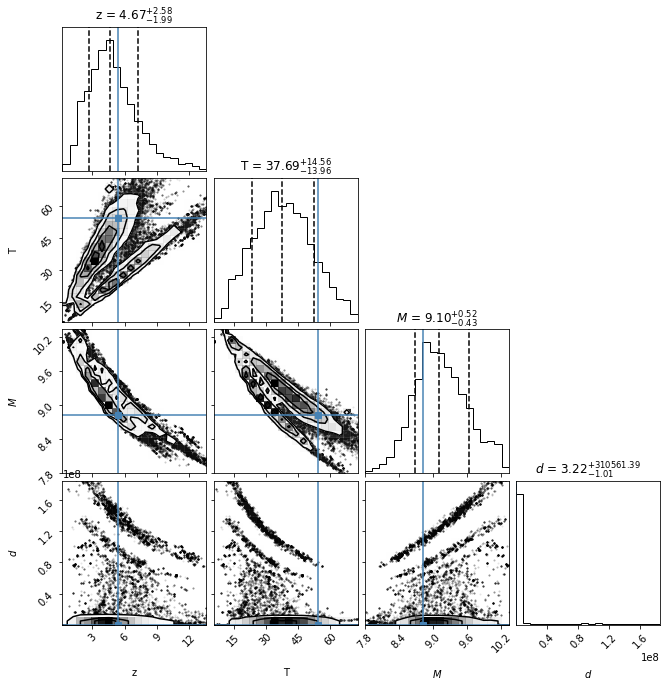

<Figure size 864x648 with 0 Axes>

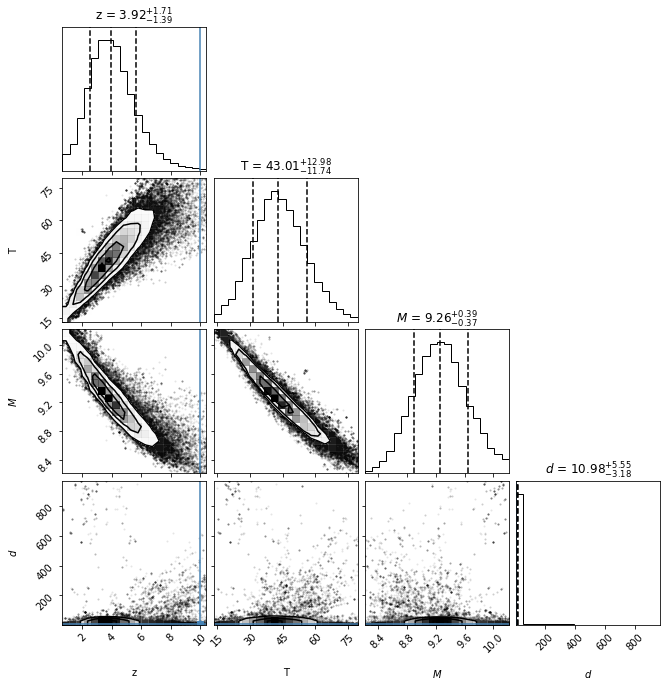

<Figure size 864x648 with 0 Axes>

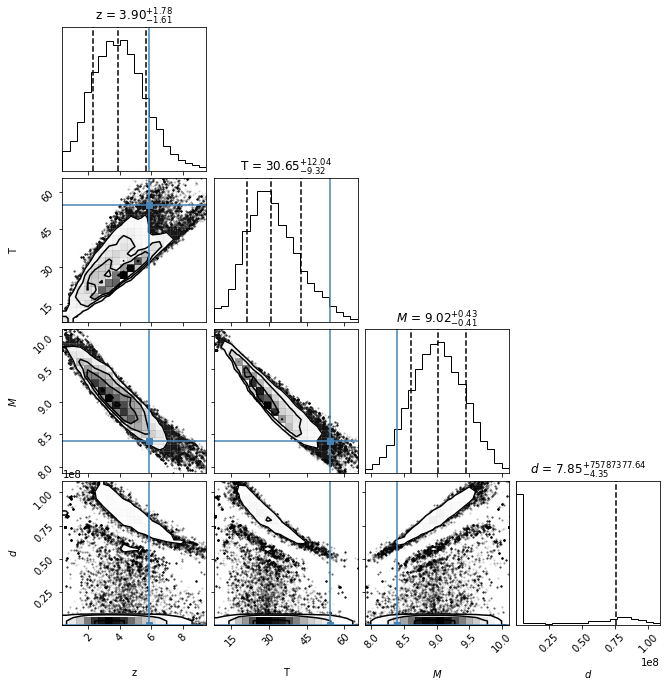

<Figure size 864x648 with 0 Axes>

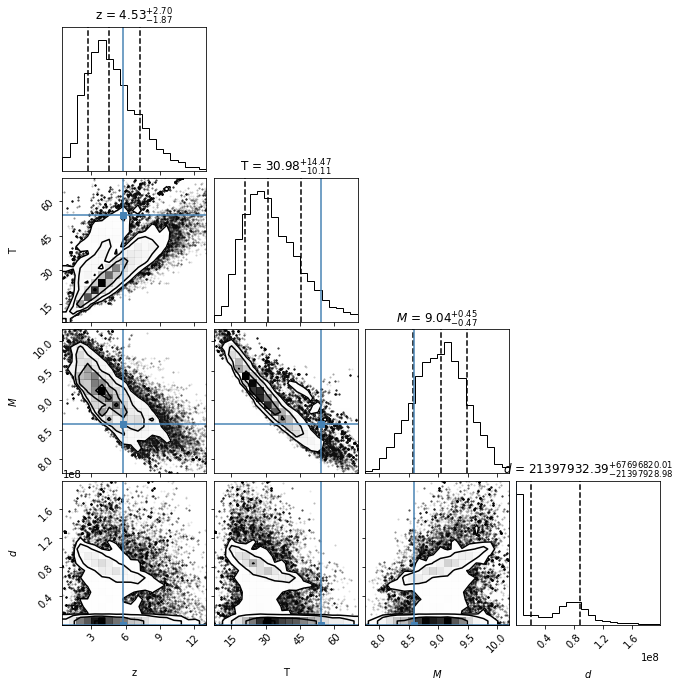

<Figure size 864x648 with 0 Axes>

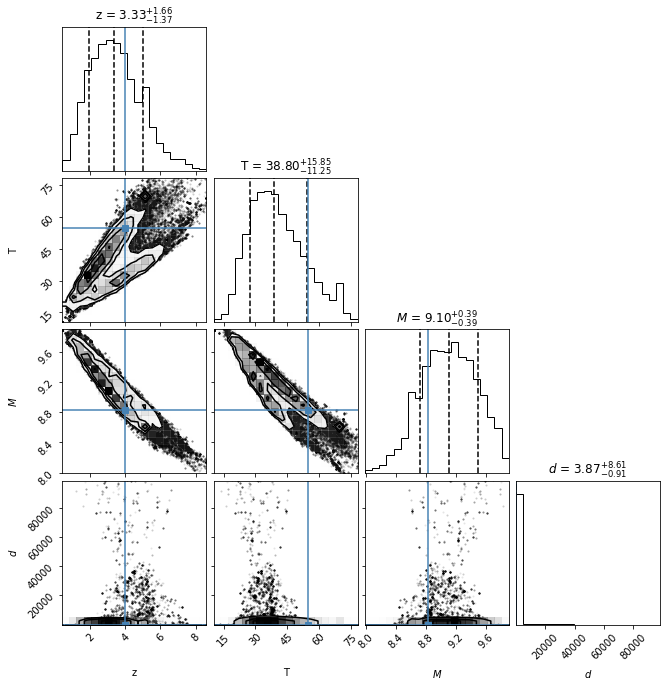

<Figure size 864x648 with 0 Axes>

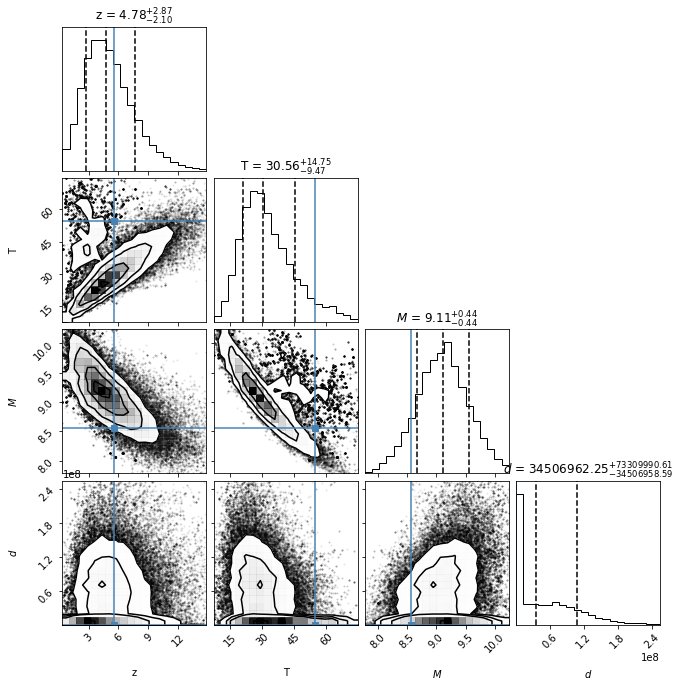

<Figure size 864x648 with 0 Axes>

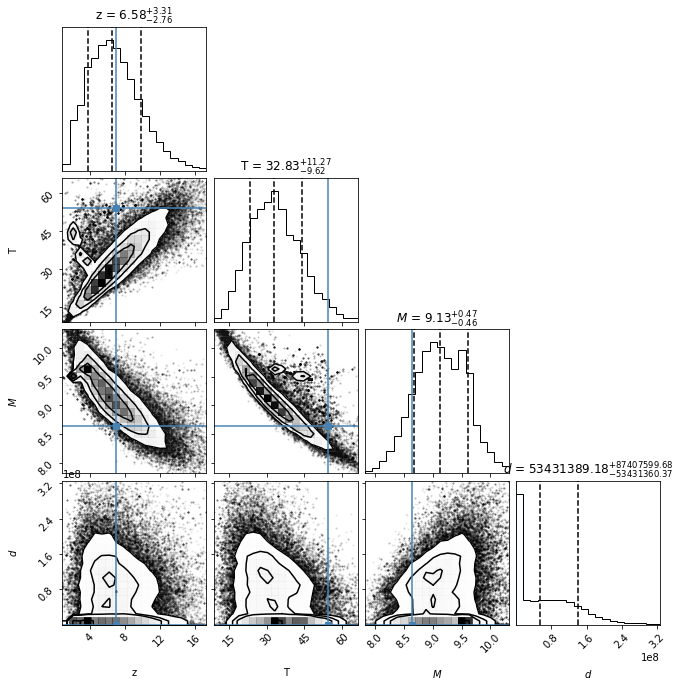

<Figure size 864x648 with 0 Axes>

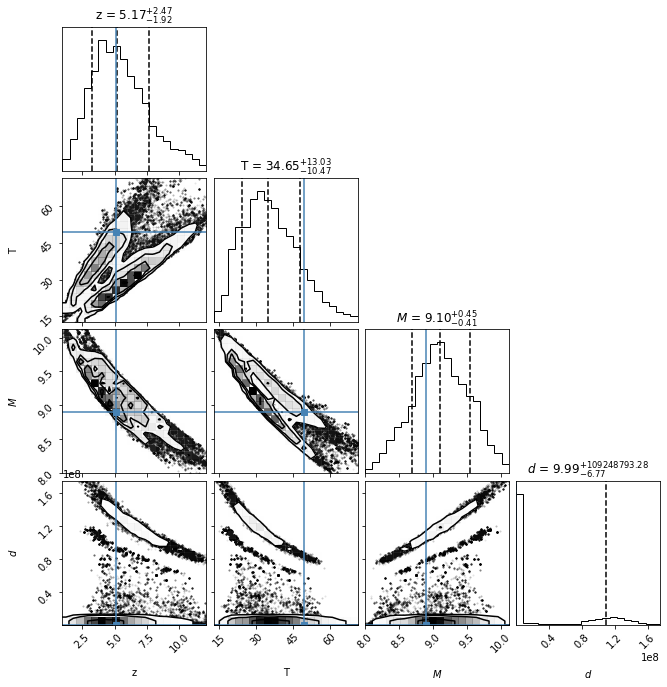

<Figure size 864x648 with 0 Axes>

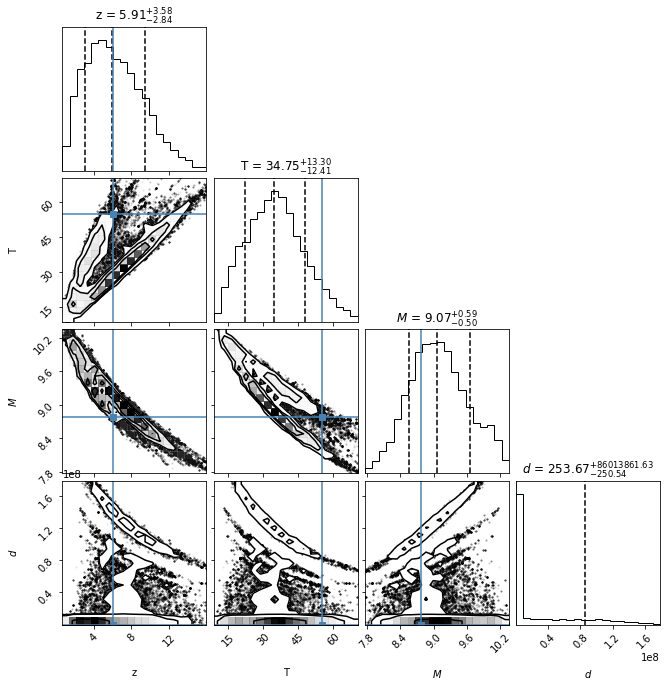

<Figure size 864x648 with 0 Axes>

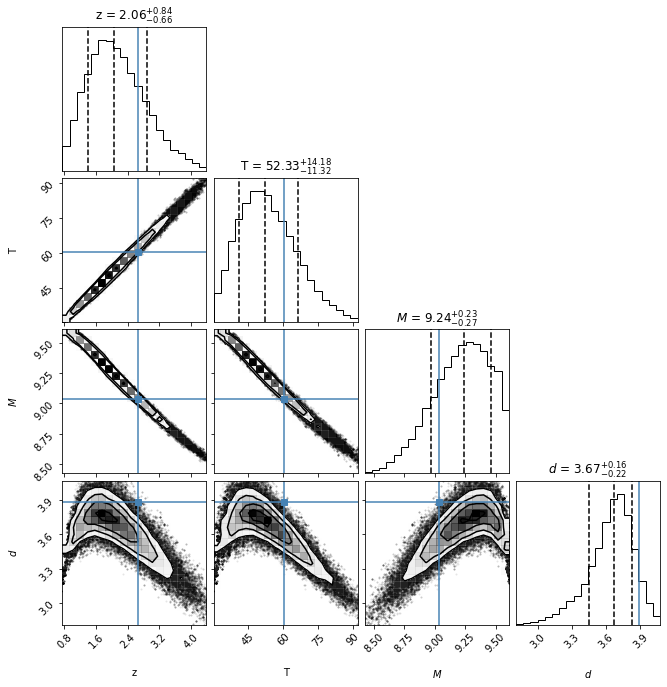

<Figure size 864x648 with 0 Axes>

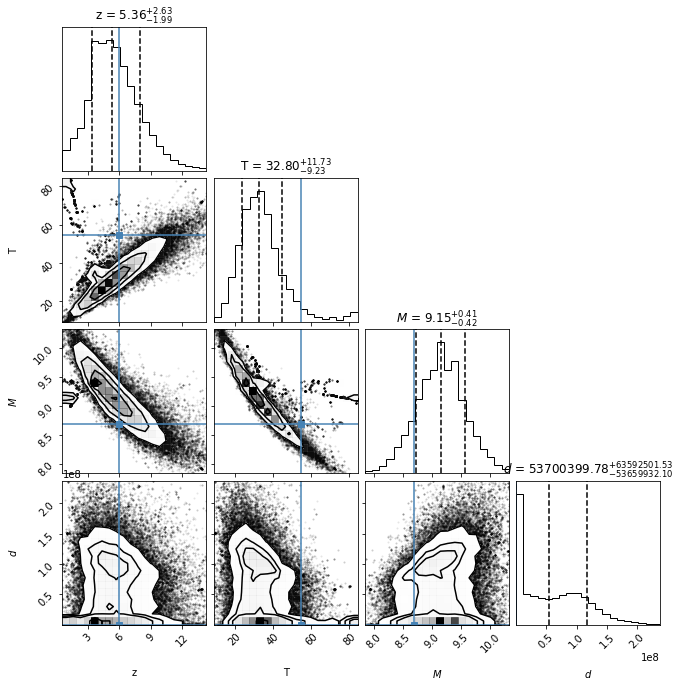

In [26]:
for i in range(len(rows)):
    print(i)
    try:
        modeloPL= mcmc_PL(ID[i],i,frecsT_l[i],errfT_l[i],"PL lim",30)
        z_mcmcT.append(modeloPL[0])
        T_mcmcT.append(modeloPL[1])
        M_mcmcT.append(modeloPL[2])
        d_mcmcT.append(modeloPL[3])
        i_mcmcT.append(i)
        ID_mcmcT.append(ID[i])
    except:
        pass
    
print(z_mcmcT)
print(T_mcmcT)
print(M_mcmcT)
print(d_mcmcT)
print(i_mcmcT)
print(ID_mcmcT)

In [27]:
zspec=[]
zmcmc=[]
Tmcmc=[]
Mmcmc=[]
dmcmc=[]

In [28]:
for item in i_mcmcT:
    zspec.append(z[item])

In [29]:
for (i,j,k,l) in zip(z_mcmcT,T_mcmcT,M_mcmcT,d_mcmcT):
    for (m,n,o,p) in zip(i,j,k,l):
        zmcmc.append(m[0])
        Tmcmc.append(n[0])
        Mmcmc.append(o[0])
        dmcmc.append(p[0])

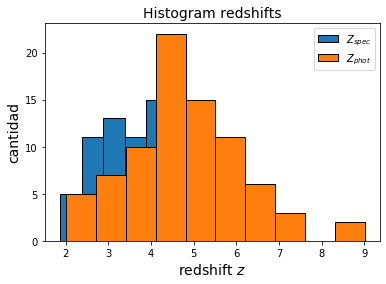

In [30]:
plt.hist(zspec,bins=10,edgecolor="k",label="$Z_{spec}$")
plt.hist(zmcmc,bins=10,edgecolor="k",label="$Z_{phot}$")
plt.title("Histogram redshifts",fontsize=14)
plt.xlabel("redshift $z$",fontsize=14)
plt.ylabel("cantidad",fontsize=14)
plt.legend()
plt.savefig("Histogram redshifts Model PL.png", dpi=300, format='png')

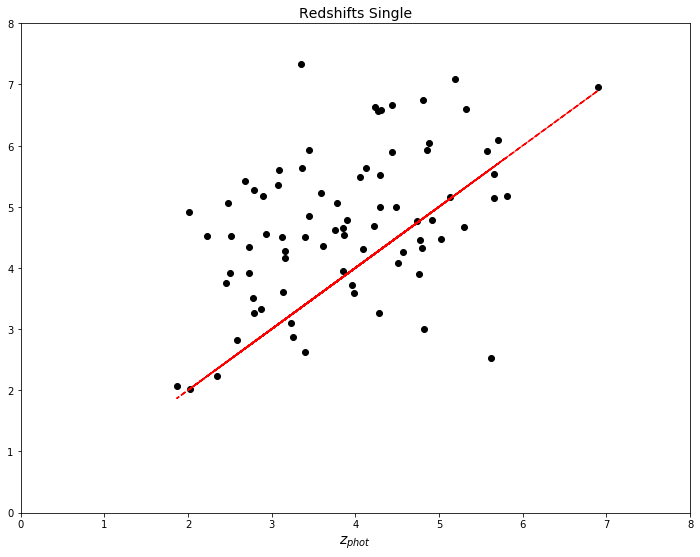

In [31]:
plt.figure(figsize=(12,9))

plt.scatter(zspec,zmcmc,c="k",marker="o")
plt.xlim([0,8])
plt.ylim([0,8])
plt.plot(zspec,zspec,c="r",ls="--")

plt.title("Redshifts Single",fontsize=14)
plt.xlabel(r"$z_{esp}$",fontsize=14)
plt.xlabel(r"$z_{phot}$",fontsize=14)
plt.savefig("redshifts (spec vs phot) Model PL.png", dpi=300, format='png')

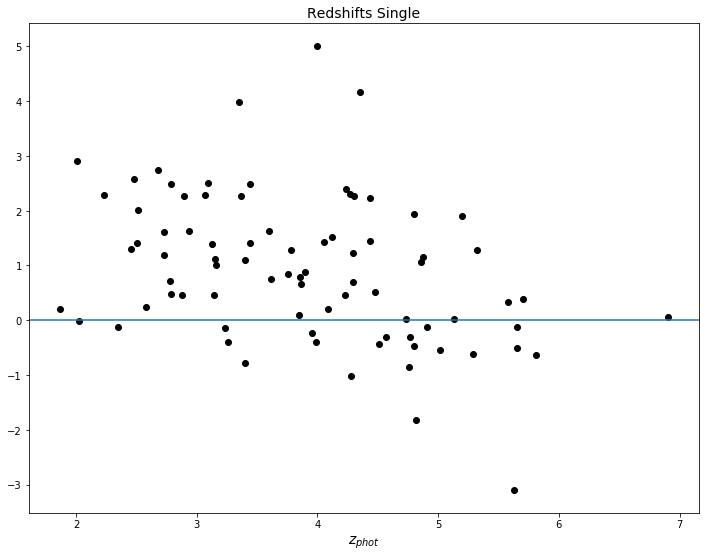

In [32]:
plt.figure(figsize=(12,9))

plt.scatter(zspec,np.array(zmcmc)-np.array(zspec),c="k",marker="o")
plt.axhline(0)

plt.title("Redshifts Single",fontsize=14)
plt.xlabel(r"$z_{esp}$",fontsize=14)
plt.xlabel(r"$z_{phot}$",fontsize=14)
plt.savefig("Dif redshifts Model PL.png", dpi=300, format='png')

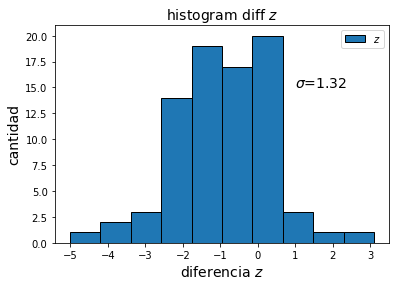

In [34]:
plt.hist(np.array(zspec)-np.array(zmcmc),bins=10,edgecolor="k",label="$z$")
plt.title("histogram diff $z$",fontsize=14)
plt.xlabel("diferencia $z$",fontsize=14)
plt.ylabel("cantidad",fontsize=14)
plt.legend()
sigma=np.std(np.array(zspec)-np.array(zmcmc))
plt.annotate("$\sigma$={}".format(np.round(sigma,2)),(1,15),fontsize=14)
plt.savefig("Histogram dif redshifts Model PL.png", dpi=300, format='png')

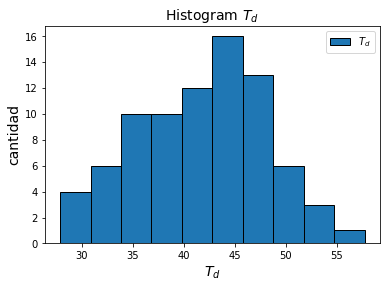

In [35]:
plt.hist(Tmcmc,bins=10,edgecolor="k",label="$T_{d}$")
plt.title("Histogram $T_{d}$",fontsize=14)
plt.xlabel("$T_{d}$",fontsize=14)
plt.ylabel("cantidad",fontsize=14)
plt.legend()
plt.savefig("Histogram T Model PL.png", dpi=300, format='png')

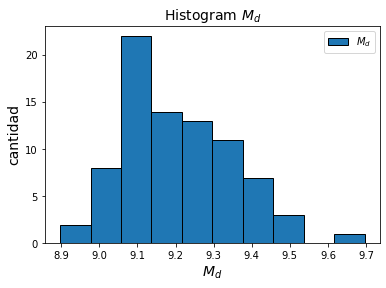

In [36]:
plt.hist(Mmcmc,bins=10,edgecolor="k",label="$M_{d}$")
plt.title("Histogram $M_{d}$",fontsize=14)
plt.xlabel("$M_{d}$",fontsize=14)
plt.ylabel("cantidad",fontsize=14)
plt.legend()
plt.savefig("Histogram M Model PL.png", dpi=300, format='png')

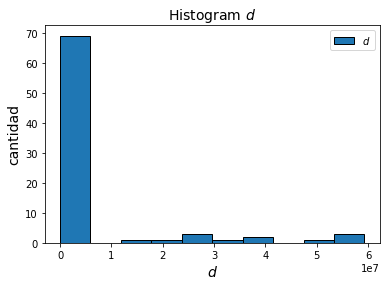

In [37]:
plt.hist(dmcmc,bins=10,edgecolor="k",label="$d$")
plt.title("Histogram $d$",fontsize=14)
plt.xlabel("$d$",fontsize=14)
plt.ylabel("cantidad",fontsize=14)
plt.legend()
plt.savefig(r"Histogram d Model PL.png", dpi=300, format='png')